In [31]:
import numpy as np
import pandas as pd
import pickle


In [2]:
new_bigtom = pd.read_csv("bigtom-modified-again.csv")
new_bigtom
# we can edit on top of this

,Story - Context,Story - Desire,Story - Perception cues,Story - Belief,Story - An external event,Percepts - Aware of event,Percepts - Not aware of event,Actions - Action given new state,Actions - Action given initial state,Questions - Belief Question,...,Answers - Belief Aware,Answers - Desire Aware,Answers - Action Aware,Answers - Belief not Aware,Answers - Desire not Aware,Answers - Action not Aware,Random Event,Percepts of R.E. - Aware of random event,Percepts of R.E. - not Aware of random event,21
0,Noor is working as a barista at a busy coffee ...,Noor wants to make a delicious cappuccino for...,Noor grabs a milk pitcher and fills it with o...,Noor believes that the milk pitcher contains ...,"A coworker, who didn't hear the customer's re...",Noor sees her coworker swapping the milk.,Noor does not see her coworker swapping the milk.,Noor opens the fridge again and reaches for th...,Noor makes the cappuccino using the milk in th...,Does Noor believe the milk pitcher contains oa...,...,Noor believes the milk pitcher contains almond...,Noor wants to make a cappuccino with oat milk.,Noor will open the fridge once again to take o...,Noor believes the milk pitcher contains oat milk.,Noor wants to make a cappuccino with oat milk.,Noor will make the cappuccino using the milk i...,A decorative mug falls from a shelf in the cof...,Noor sees the decorative mug falling from the ...,Noor does not see the decorative mug falling f...,auto;0
1,Zara is attending an art exhibition at a local...,Zara wants to learn more about a particular a...,The label next to the artwork states that the...,Zara believes that the painting is the work o...,"A gallery staff member, realizing there was a...",Zara reads the updated label carefully.,Zara does not read the updated label.,Zara looks for more information about the emer...,Zara looks for more information about the famo...,Does Zara believe the painting is the work of ...,...,Zara believes the painting is the work of an e...,Zara wants to learn more about the painting an...,Zara will look for more information about the ...,Zara believes the painting is the work of a fa...,Zara wants to learn more about the painting an...,Zara will look for more information about the ...,A gallery visitor accidentally spills a glass ...,Zara observes the water spill.,Zara does not observe the water spill.,auto;0
2,Carlos is a farmer in a small village in Mexic...,He wants to irrigate his crops by opening a w...,Carlos closed the valve the previous evening.,Carlos believes the valve is currently closed.,"During the night, heavy rainfall caused the r...",Carlos sees the flooded cornfield.,Carlos does not see the flooded cornfield.,Carlos calls his neighbour to ask them if they...,Carlos calls his neighbour to ask them if they...,Does Carlos believe the water valve is closed ...,...,Carlos believes the water valve is open.,Carlos wants to close the valve due to the flo...,Carlos will call his neighbour to ask them if ...,Carlos believes the water valve is closed.,Carlos wants to open the valve to irrigate his...,Carlos will call his neighbour to ask them if ...,A group of wild turkeys wanders into the cornf...,Carlos notices the wild turkeys in his field.,Carlos does not notice the wild turkeys in his...,auto;0
3,Kofi is a fisherman from a small village in Gh...,He wants to catch enough fish today to provid...,Kofi repaired his fishing net last night.,Kofi believes that his fishing net is in good...,"While Kofi is away from his boat, a group of ...",Kofi observes the monkeys damaging his fishing...,Kofi does not see the monkeys damaging his fis...,Kofi buys new repair equipment for fixing the ...,Kofi goes fishing with his net.,Does Kofi believe his fishing net is in good c...,...,Kofi believes his fishing net is torn apart.,Kofi wants to catch fish with his net in good ...,Kofi will buy new repair equipment for fixing ...,Kofi believes his fishing net is in good condi...,Kofi wants to catch fish with his net in good ...

In [3]:
import json
import re
import sys
import time
import warnings
from random import sample

import openai
from openai import AzureOpenAI
import pandas as pd
# from tqdm import tqdm
import tiktoken
douglas_key = "840e5140fd194e28a6efc8e571e09b2a"

# Parameters
client = AzureOpenAI(
  azure_endpoint = "https://hkust.azure-api.net",
  api_version = "2024-06-01",
  api_key = douglas_key #put your api key here
)

# Function
def get_response(message, instruction):
    response = client.chat.completions.create(
		model = 'gpt-4',
        temperature = 1,
        messages = [
            {"role": "system", "content": instruction},
            {"role": "user", "content": message}
        ]
    )
    
    # print token usage
    print(response.usage)
    # return the response
    return response.choices[0].message.content
  
def LM_generation(prompt, max_tokens = 10, temperature = 0.1, model = "gpt-4", system_msg = None, msg_history = None):
    retry_attempt = 5
    retry_num = 0
    generation_success = False
    messages = []
    if system_msg is not None:
        messages.append({'role':'system', 'content': system_msg})
    if msg_history is not None:
        messages = msg_history
    messages.append({'role':'user', 'content':prompt})
    while retry_num < retry_attempt and not generation_success:
        try:
            gen = client.chat.completions.create(
                model = model,
                messages = messages,
                max_tokens = max_tokens,
                temperature = temperature,
            ) 
            generation_success = True
            input_tokens = gen.usage.prompt_tokens
            output_tokens = gen.usage.completion_tokens
        except openai.APIError as e:
            retry_num += 1
            generation_success = False
            time.sleep(5)
            # return "openai.error.APIError", -1, -1 
        except openai.RateLimitError as e:
            retry_num += 1
            generation_success = False
            time.sleep(30)
        except:
            retry_num += 1
            generation_success = False
            time.sleep(10)
    
    if generation_success:
        if gen == None or gen.choices[0] == None or gen.choices[0].message == None or gen.choices[0].message.content == None:
            return "", 0, 0
        return gen.choices[0].message.content.strip(), input_tokens, output_tokens
    else:
        return "Error", -1,-1

def count_tokens(text, encoding_name = "cl100k_base"):
    encoding = tiktoken.get_encoding(encoding_name)
    # print(text)
    num_tokens = len(encoding.encode(text))
    return num_tokens


In [4]:

for col in new_bigtom.columns:
    print(col, " : ", new_bigtom.iloc[7][col])

Story - Context  :  Kael is a farmer in a remote village in the Andes.
Story - Desire  :   Kael wants to plant a new crop of high-altitude potatoes in one of his terraced fields.
Story - Perception cues  :   The soil in the field appears rich and well-fertilized.
Story - Belief  :   Kael believes that the soil is rich and well-fertilized.
Story - An external event  :   Overnight, heavy rainfall washes away much of the fertile soil, leaving mostly rocky dirt behind.
Percepts - Aware of event  :  Kael notices the change in the soil after the rainfall.
Percepts - Not aware of event  :  Kael does not notice the change in the soil after the rainfall.
Actions - Action given new state  :  Kael buys more fertilizer and compost for the soil.
Actions - Action given initial state  :  Kael plants the high-altitude potatoes in the field.
Questions - Belief Question  :  Does Kael believe the soil is rich and well-fertilized or mostly rocky dirt?
Questions - Desire Question  :  Does Kael want to plan

In [4]:
protag_name = [new_bigtom.iloc[i]['Story - Context'].split()[0] for i in range(new_bigtom.shape[0])]
print(protag_name)

['Noor', 'Zara', 'Carlos', 'Kofi', 'Azola', 'Ravi', 'Kofi', 'Kael', 'Farhan', 'Abhay', 'Aniket', 'Lila', 'Kavi', 'Hiroshi', 'Juan', 'Mei', 'Juanita', 'Mei', 'Cheng', 'Jia', 'Isabela', 'Emeka', 'Luka', 'Amaury', 'Chi', 'Mei', 'Mei', 'Nia', 'Heiwa', 'Amina', 'Fatima', 'Fatima', 'Nneka', 'Fatima', 'Amina', 'Aiko', 'Carlos', 'Mateo', 'Miguel', 'Carlos', 'Carlos', 'Amara', 'Fatima', 'Fatima', 'Aisha', 'Amara', 'Juan', 'Hiroshi', 'Yoshi,', 'Takumi', 'Hiro', 'Tumelo', 'Kofi', 'Lila', 'Odette', 'Mei', 'Fatima', 'Kwame', 'Luka', 'Olumide,', 'Odion', 'Ibrahim', 'Rohan', 'Rohit', 'Kunal', 'Amara', 'Leilani', 'Amina', 'Amara,', 'Amina', 'Fatima', 'Mei', 'Yara', 'Isabella', 'Xia', 'Mei', 'Olabisi', 'Kalyani', 'Kavya', 'Amara', 'Naledi', 'Emilia', 'Mei', 'Emeka', 'Aria', 'Ailani', 'Takeshi', 'Ravi', 'Surya', 'Takeshi', 'Hiroshi', 'Kwame', 'Ngozi', 'Naledi', 'Lila', 'Amara', 'Mei,', 'Mei,', 'Jia', 'Enrique', 'Amara', 'Kwasi', 'Fatima', 'Kofi', 'Kofi', 'Amrita', 'Amina', 'Priya', 'Nkiru', 'Aisha', 'Ta

In [96]:
print(new_bigtom.shape[0])

200


Story: {Story - Context} {Story - Desire} {Story - Perception cues} {Story - Belief}

Event: {Causal Event}

Instructions: From this Story, generate 10 perceptual cues that {protagonist name} may notice about the Event. Each perceptual cue should continue the Story and Event. Write one sentence for each perceptual cue. Avoid descriptions of {protagonist name}’s thoughts. Be creative and make the stories diverse (from different contexts).


Based on the following story and event, generate five perceptual cues that the main character might encounter, which could challenge their belief. Each cue should be creative, reasonable, and systematically explore different sensory modalities. Be descriptive and only make vivid descriptions about the perceptual cue, without describing the main character's thoughts nor making explicit comparisons.

Visual
Auditory
Olfactory
Gustatory
Tactile

Thermoception (temperature)
Proprioception (body position)
Chronoception (concept of time)
Social Perception 

1. Generate Stories

In [5]:
# process story
# given string input, return structuralized story 

def process(percept_text, senses, mode = 'default'):
    # given string input of story
    percept_text = percept_text.split('\n')  # format for each cue: 'cue name', 'cue 1', 'cue 2', blank.
    if mode == 'default':
        if len(percept_text) not in [4*len(senses)-1, 4*len(senses)]:
            print('process() not done correctly')
        return {senses[i]:[percept_text[4*i+1][3:], percept_text[4*i+2][3:]] for i in range(len(senses))}
    
    elif mode == 'random':
        if len(percept_text) not in [3*len(senses)-1, 3*len(senses)]:
            print('process() not done correctly')
        return {senses[i]:percept_text[3*i+1] for i in range(len(senses))}
        
    

In [128]:
# Already generated stories:
# Store LLM output in a dictionary.

# Stories we already have:
stories = []
stories.append("### Visual Cues\n1. A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font, contrasting sharply with the soft beige of the oat milk packaging Noor is accustomed to seeing.\n2. As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns.\n\n### Auditory Cues\n1. The familiar sound of the milk frother fills the air, but as Noor froths the milk, it emits a distinct, higher-pitched whirring noise, reminiscent of the sound made by nut-based milks. The frothing seems to create a different texture, a sound that feels lighter, almost airy, rather than the rich, velvety sound of oat milk.\n2. A sudden burst of laughter from a nearby table draws Noor's attention. Among the chatter, she catches a fleeting remark about how nut milks are often a bit more watery. The comment lingers in her ears, contrasting with her certainty about the creamy richness of oat milk.\n\n### Olfactory Cues\n1. As Noor brings the pitcher closer to the steaming espresso, a faint nutty aroma wafts through the air, subtly mingling with the rich scent of coffee. The fragrance is lighter and less sweet than the familiar, comforting smell of oat milk, creating a momentary confusion in the sensory landscape.\n2. The steam rising from the espresso machine carries a hint of a toasty, roasted scent that reminds Noor of almond cookies baking in an oven. This aroma, while pleasant, feels out of place alongside the usual warm, grainy scent of oat milk that she expects.\n\n### Gustatory Cues\n1. As Noor takes a sip from the cappuccino she just made, a slightly unexpected flavor profile unfurls on her palate. The initial creaminess is quickly overshadowed by a subtle, nutty taste that lingers, creating a contrast to the sweetness she anticipates from oat milk.\n2. The foam atop the cappuccino feels oddly light and airy, almost like a whisper of sweetness rather than the rich, thick layer she is accustomed to. The texture dances on her tongue, evoking memories of almond-flavored desserts rather than the comforting, hearty taste of oat milk.\n\n### Tactile Cues\n1. As Noor grips the pitcher, she notices it feels unusually light, almost too light compared to the weight she expects from a full pitcher of oat milk. The sensation creates a fleeting moment of uncertainty as she pours, almost as if the contents are less substantial.\n2. While frothing the milk, her fingers brush against the pitcher’s cool surface, which seems chillier than she remembers. The temperature feels slightly off, creating an unexpected contrast to the warmth of the espresso machine nearby.\n\n### Thermoception Cues\n1. The warmth radiating from the espresso machine contrasts sharply with the cooler sensation of the milk pitcher in her hand. The slight chill from the milk sends a shiver up her arm, a sensation that feels out of harmony with the toasty environment of the café.\n2. As Noor sets the cappuccino on the counter, she feels the heat of the cup beneath her palm, but the foam feels less warm than usual, almost as if the milk has not taken on the heat that she expects from steaming oat milk.\n\n### Proprioception Cues\n1. Noor's wrist feels a peculiar strain as she pours, a sensation that is unfamiliar when she is accustomed to the weight of oat milk. The way her arm moves feels slightly off, as if the pitcher is lighter and causing her to adjust her grip and angle more than usual.\n2. As she leans over to serve the cappuccino, her body feels slightly misaligned, a sensation that hints at an unexpected change in the weight distribution of the pitcher. The action requires her to concentrate more than it typically would.\n\n### Chronoception Cues\n1. The seconds seem to stretch as Noor pours the milk, the usual rhythm of her movements feeling disrupted. Each moment feels elongated, as if she is caught in a slow-motion replay of a simple action, heightening her awareness of the task at hand.\n2. As she waits for the milk to froth, the ticking of the café clock seems to echo louder in her ears, each tick marking time in an almost exaggerated manner, intensifying her focus on the process and creating an odd sense of urgency.\n\n### Social Perception Cues\n1. A customer at the counter raises an eyebrow as they take their first sip, their expression shifting subtly from anticipation to surprise. The brief moment of their reaction catches Noor’s attention, leaving her to wonder what they might be tasting.\n2. A coworker glances over, a knowing smile on their face, while engaging in a light-hearted conversation with another patron. The casual exchange suggests an unspoken understanding of the nuances between different milk types, which piques Noor’s curiosity about her own creation.")
stories.append("### Visual Cues\n1. A small group of art enthusiasts nearby is animatedly discussing the painting, their gestures emphasizing the vibrant hues and erratic brushstrokes. Zara’s gaze drifts to their animated faces, noticing how their expressions convey a sense of excitement and discovery rather than reverence, contrasting with her admiration for the artist's supposed fame.\n2. As Zara leans in closer to the painting, she observes subtle imperfections in the canvas. Tiny flecks of paint are splattered on the edges, and the texture feels more raw and unrefined, as if the artwork has just emerged from a personal journey rather than a polished gallery experience.\n\n### Auditory Cues\n1. The soft murmur of conversation around Zara becomes punctuated by a sudden burst of laughter from a nearby group, their playful banter highlighting the casual atmosphere of the exhibition. The light-heartedness contrasts with the solemnity she initially associated with the art of a well-known artist.\n2. A gallery staff member’s voice carries over the crowd, explaining the significance of the emerging artist’s work to a visitor. The tone is enthusiastic and filled with anecdotes, creating an inviting ambiance that feels more intimate than the grand narratives typically surrounding famous artists.\n\n### Olfactory Cues\n1. A waft of fresh paint lingers in the air, mingling with the faint scent of linseed oil. This aroma, rich and earthy, evokes a sense of creation and experimentation, suggesting a connection to the artist's evolving journey rather than the established reputation of a famous figure.\n2. Nearby, the scent of freshly brewed coffee from the gallery's café seeps into the exhibition space, its warmth and comfort contrasting with the cool, sterile smell of the gallery. This inviting aroma seems to draw visitors into a more personal experience with the art.\n\n### Gustatory Cues\n1. As Zara sips a complimentary glass of sparkling water, the effervescence tingles on her tongue, refreshing her senses and breaking the solemnity of the art. The lightness of the drink mirrors the playful nature of the abstract painting she admires, hinting at a more spontaneous creator.\n2. A small plate of artisanal crackers is passed around among a group of attendees. The crunch and subtle nuttiness of the crackers invite a communal experience, contrasting with the solitary admiration of a famous artist's work.\n\n### Tactile Cues\n1. The rough texture of the gallery wall brushes against Zara's fingertips as she leans in closer to the painting, the uneven surface making her acutely aware of the handmade quality of the art, which feels less distant than the polished pieces typically associated with established artists.\n2. Zara picks up a small brochure about the exhibition, noticing its glossy finish and the weight of the paper. The heft of the brochure in her hand feels substantial, grounding her in the reality of the emerging artist’s narrative, as opposed to the ethereal quality she imagines with renowned creators.\n\n### Thermoception Cues\n1. As Zara shifts her position, she feels a slight chill from the air conditioning circulating through the gallery, a stark contrast to the warmth radiating from the crowd gathered around the emerging artist’s work. This temperature change brings a sense of immediacy to her experience, highlighting the connection between the audience and the art.\n2. Standing near a large window, Zara feels the sun’s rays briefly warm her skin, a gentle reminder of the outside world. The warmth envelops her, creating a sense of intimacy with the art that feels more personal than the detachment she associates with famous artists.\n\n### Proprioception Cues\n1. Zara adjusts her stance, feeling the weight of her body shift as she leans closer to the painting. The subtle pull in her muscles reminds her of the effort involved in truly engaging with the art, suggesting an intimacy that differs from the passive admiration she expected of a renowned piece.\n2. As she steps back to take in the entire painting, Zara senses the shift in her center of gravity, a grounding feeling that connects her to the space around her, emphasizing a relationship with the artwork that is more fluid and dynamic than the static presence of a famous artist's work.\n\n### Chronoception Cues\n1. The steady tick of a clock on the wall punctuates the air, reminding Zara of the fleeting nature of time spent in the gallery. Each second feels alive with potential, contrasting with the timelessness often attributed to the works of famous artists.\n2. As Zara glances at her watch, she notices how the minutes seem to melt away, each moment filled with vibrant discussions and discoveries, creating a sense of urgency that feels far removed from the static legacy of established art figures. \n\n### Social Perception Cues\n1. A pair of visitors nearby passionately debate the meaning behind the painting, their voices rising and falling with excitement. The camaraderie they share paints a picture of collective exploration, shifting the focus from individual fame to shared artistic journeys.\n2. Zara observes a small child pointing at the painting, eyes wide with wonder, tugging at their parent’s sleeve to share their thoughts. The innocent fascination of the child creates a sense of community around the artwork, contrasting with the reverence usually reserved for celebrated artists.")
stories.append("### Visual Cues\n1. A shimmering expanse of water stretches across the cornfield, glinting under the morning sun. The once golden stalks of corn stand half-submerged, their vibrant green leaves contrasting against the unexpected pool of murky brown, creating a surreal landscape that feels both beautiful and alarming.\n2. Distant silhouettes of familiar farm tools, usually stacked neatly in the barn, now appear distorted through the haze of water vapor rising from the flooded ground. The tools seem almost ghostly, as if they are floating in an ethereal realm rather than resting on solid earth.\n\n### Auditory Cues\n1. The rhythmic sound of dripping water echoes in the air, each drop splashing against the muddy ground with a soft plop, creating a melody that seems to whisper secrets about the night’s unexpected events. The gentle chorus of trickling water carries a sense of urgency, urging attention.\n2. A chorus of frogs and insects fills the air, their croaks and chirps creating a cacophony that was absent just hours before. The volume and intensity of their sounds crescendo, as if they are celebrating the arrival of an uninvited guest in the landscape.\n\n### Olfactory Cues\n1. The rich, earthy scent of wet soil wafts through the air, mingling with the sweet aroma of corn that has begun to ferment in the warm sun. This intoxicating blend pulls at the senses, signaling a shift in the environment that is both familiar and unsettling.\n2. A sharp, tangy whiff of decaying plant matter rises from the flooded field, mixing with the freshness of rain-soaked earth. The odor is pungent and distinct, contrasting with the usual sweet fragrance of ripening corn that typically permeates the farm.\n\n### Gustatory Cues\n1. A sudden taste of saltiness lingers on Carlos's lips, reminiscent of brackish water, unexpected in the context of his usual crisp, sweet corn. This unusual flavor hints at something amiss, as if the environment has conspired to introduce an alien element to his world.\n2. As he takes a sip of water from his canteen, the liquid feels different on his tongue, slightly metallic and colder than usual, as if it has absorbed the essence of the river that has surged forth overnight.\n\n### Tactile Cues\n1. The ground beneath Carlos’s feet squelches with every step, a thick, viscous mud that clings to his boots, pulling at them as he tries to move. The sensation is foreign, reminding him of slipping through a bog rather than walking through his familiar field.\n2. A sudden splash of water hits his hand as he reaches down to examine a fallen stalk of corn, the coolness sending a jolt up his arm. The sensation is shocking, a stark contrast to the warmth of the sun on his back.\n\n### Thermoception Cues\n1. A cool breeze sweeps across the field, carrying with it a damp chill that feels unusually refreshing against the warmth of the sun. The contrast creates an unsettling sensation, as if the air itself is warning him of a shift in the weather that he cannot see.\n2. The water pooling around his ankles feels significantly colder than the ambient temperature, a stark reminder of the river’s frigid depths. Each wave that laps against his skin sends shivers up his spine, contrasting with the warmth radiating from the sun overhead.\n\n### Proprioception Cues\n1. As Carlos attempts to navigate the flooded field, he feels the unexpected weight of his boots, now laden with thick mud that pulls at his movements, creating a sensation of resistance that alters his usual confident stride.\n2. The uneven ground beneath him shifts unpredictably with each step, causing him to adjust his balance constantly, as if he were walking on a trampoline rather than the firm soil he knows so well.\n\n### Chronoception Cues\n1. Time seems to stretch as he watches the water slowly rise, each second feeling elongated, like a slow-motion film where every droplet cascading down the stalks of corn is exaggerated, creating an almost surreal experience of the moment.\n2. The shadows cast by the sun appear to shift erratically, as if the day is playing tricks on him, making the hours feel disjointed and confusing, blurring the line between morning and the remnants of night.\n\n### Social Perception Cues\n1. A neighbor, usually cheerful and chatty, stands at the edge of the field with a furrowed brow, their silence heavy in the air. The lack of their customary greeting feels like a silent acknowledgment of something unspoken, creating a tension that hangs between them.\n2. Children from the village gather nearby, their laughter echoing strangely against the backdrop of the flooded field. Their playful shouts sound hollow, as if the joy of the moment cannot mask the underlying concern for the crops and the land.")
#gustatory, tactile, thermoception (sense of temperature about objects), proprioception (sense of body position/weight), chronoception (sense of time), social perception.
senses = ['visual', 'auditory', 'olfactory', 'gustatory', 'tactile', 'thermo', 'proprio', 'chrono', 'social']
num_senses = len(senses)
# we want to produce a list of dictionary. think about how to process later. each dictionary is a list of two strings.
# percept = [] 
percept_processed = []
for i in range(3):
    input_text = stories[i]
    # input_text = input_text.split('\n') 
    # print(len(input_text))
    # # print((input_text[3::4]))
    # # percept.append({senses[i]:input_text[4*i+1:4*i+3] for i in range(num_senses)})
    # # get rid of numbering
    # percept_processed.append({senses[i]:[input_text[4*i+1][3:], input_text[4*i+2][3:]] for i in range(num_senses)})
    percept_processed.append(process(input_text, senses))

print(percept_processed[0]['auditory'])
# print(percept_processed[1].keys())



['The familiar sound of the milk frother fills the air, but as Noor froths the milk, it emits a distinct, higher-pitched whirring noise, reminiscent of the sound made by nut-based milks. The frothing seems to create a different texture, a sound that feels lighter, almost airy, rather than the rich, velvety sound of oat milk.', "A sudden burst of laughter from a nearby table draws Noor's attention. Among the chatter, she catches a fleeting remark about how nut milks are often a bit more watery. The comment lingers in her ears, contrasting with her certainty about the creamy richness of oat milk."]


In [6]:
num_stories = new_bigtom.shape[0] # num_stories in bigtom
print(num_stories)

200


In [7]:
#save

def save_list_of_dict(save_name, list_of_dict):
    with open(save_name, 'wb') as f:
        pickle.dump(list_of_dict, f)

def load_list_of_dict(save_name):
    with open(save_name, 'rb') as f:
        loaded = pickle.load(f)
    return loaded

In [135]:
# Don't do this. I will delete everything I made
# save_list_of_dict('saved_processed_percepts.pkl', percept_processed)

In [ ]:
# import pickle 

# with open('saved_dictionary.pkl', 'wb') as f:
#     pickle.dump(dictionary, f)
        
# with open('saved_dictionary.pkl', 'rb') as f:
#     loaded_dict = pickle.load(f)

In [138]:
print(len(percept_processed))

3


In [ ]:
# Generate Story Template
# i = 1
import time 
input_tokens = 0
output_tokens = 0

begin = time.time()

for i in range(78,200): # skip 0 cuz we already did it. 
    print("Generating:", i, "-th prompt")
    prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']}\n\n"
    prompt += f"Main character's belief: {new_bigtom.iloc[i]['Story - Belief']}\n\n"
    # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
    prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']} \n\n"
    
    # prompt += f"Instructions: From this Story, generate 10 perceptual cues that {protag_name[i]} may notice about the Event. "
    # prompt += f"Each perceptual cue should continue the Story and Event. Write one sentence for each perceptual cue. "
    # prompt += f"Avoid descriptions of {protag_name[i]}\'s thoughts. Be systematic, reasonable, creative, and innovative, and make the stories diverse (from different contexts). "
    # prompt += f"Avoid making direct comparisons to the item mentioned in the event, but make vivid descriptions about the difference."
    
    # 
    #  visual, auditory, olfactory, gustatory, tactile, 
    prompt += "Instructions: Based on the following story and event, generate perceptual cues that the main character might encounter, "
    prompt += "which MUST challenge their belief. Each cue should be creative, reasonable, and systematically explore the sensory modalities of: visual, auditory, olfactory, gustatory, tactile, thermoception (sense of temperature about objects), proprioception (sense of body position/weight), social perception. "
    prompt += "Be descriptive and only make vivid descriptions about the perceptual cue, without describing the main character's thoughts. Avoid making explicit comparisons between the event and the main character's belief. Generate 2 perceptual cues for each sensory modality. "
    prompt += "Be super duper creative! "
    prompt += "Do not use these words: different, difference, instead of, contrasts.\n"
    prompt += "For each cue, write your output in a format like this example: \n"
    prompt += "### Visual Cues\n1. A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font, contrasting sharply with the soft beige of the oat milk packaging Noor is accustomed to seeing.\n 2. As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns.\n\n"

    # prompt += 'Write your output in this template: “### <sense 1> Cues\n1. <perceptual cue (variable length)>\n2. <perceptual cue (variable length)>\n\n### <sense 2> Cues\n1. <perceptual cue (variable length)>\n2. <perceptual cue (variable length)>”'
    # prompt += "Here are some general examples of how perceptual cues should look like, for your reference: "
    # prompt += "1. Maria sees smoke coming from the kitchen, suggesting a fire. Should she change her belief about the kitchen being safe? "
    # prompt += "2. Lila smells gas in the garage, where she believes everything is secure. Should she change her belief about the safety of the garage? "
    
    # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
    input_tokens += count_tokens(prompt)
    
    # print(prompt)
    for _ in range(1): # generate 3 outputs. 
        # print("iteration ")
        max_tokens = 1500
        output = LM_generation(prompt, temperature = 0.6, max_tokens = max_tokens, model = "gpt-4o-mini")
        # print(output)
        # put output into the percept_processed
        percept_processed.append(process(output[0], senses))
        output_tokens += count_tokens(output[0])
        if (count_tokens(output[0])>1200):
            print("Warning: long input")
        if (count_tokens(output[0])>max_tokens):
            print("Error: LLM didn't manage to finish. Plz check again")
        # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
        save_list_of_dict('saved_processed_percepts.pkl', percept_processed)
    
    if i % 5 == 0:
        save_list_of_dict(f'saved_processed_percepts_backup_v{i}.pkl', percept_processed) # for backup purpose
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)





Generating: 78 -th prompt


In [143]:
# Diagnostics

i == 77
print("Generating:", i, "-th prompt")
prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']}\n\n"
prompt += f"Main character's belief: {new_bigtom.iloc[i]['Story - Belief']}\n\n"
# prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']} \n\n"

# prompt += f"Instructions: From this Story, generate 10 perceptual cues that {protag_name[i]} may notice about the Event. "
# prompt += f"Each perceptual cue should continue the Story and Event. Write one sentence for each perceptual cue. "
# prompt += f"Avoid descriptions of {protag_name[i]}\'s thoughts. Be systematic, reasonable, creative, and innovative, and make the stories diverse (from different contexts). "
# prompt += f"Avoid making direct comparisons to the item mentioned in the event, but make vivid descriptions about the difference."

# 
#  visual, auditory, olfactory, gustatory, tactile, 
prompt += "Instructions: Based on the following story and event, generate perceptual cues that the main character might encounter, "
prompt += "which MUST challenge their belief. Each cue should be creative, reasonable, and systematically explore the sensory modalities of: visual, auditory, olfactory, gustatory, tactile, thermoception (sense of temperature about objects), proprioception (sense of body position/weight), chronoception (sense of time), social perception. "
prompt += "Be descriptive and only make vivid descriptions about the perceptual cue, without describing the main character's thoughts. Avoid making explicit comparisons between the event and the main character's belief. Generate 2 perceptual cues for each sensory modality. "
prompt += "Be super duper creative! "
prompt += "Do not use these words: different, difference, instead of, contrasts.\n"
prompt += "For each cue, write your output in a format like this example: \n"
prompt += "### Visual Cues\n1. A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font, contrasting sharply with the soft beige of the oat milk packaging Noor is accustomed to seeing.\n 2. As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns.\n\n"
print(prompt)
# prompt += 'Write your output in this template: “### <sense 1> Cues\n1. <perceptual cue (variable length)>\n2. <perceptual cue (variable length)>\n\n### <sense 2> Cues\n1. <perceptual cue (variable length)>\n2. <perceptual cue (variable length)>”'
# prompt += "Here are some general examples of how perceptual cues should look like, for your reference: "
# prompt += "1. Maria sees smoke coming from the kitchen, suggesting a fire. Should she change her belief about the kitchen being safe? "
# prompt += "2. Lila smells gas in the garage, where she believes everything is secure. Should she change her belief about the safety of the garage? "

# print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
input_tokens += count_tokens(prompt)

# print(prompt)
for _ in range(1): # generate 3 outputs. 
    # print("iteration ")
    output = LM_generation(prompt, temperature = 0.6, max_tokens = 2000, model = "gpt-4o-mini")
    # print(output)
    # put output into the percept_processed
    print(output)
    # percept_processed.append(process(output[0], senses))
    output_tokens += count_tokens(output[0])
    
    if (count_tokens(output[0])>1200):
        print("Warning: long input")
    if (count_tokens(output[0])>1500):
        print("Error: LLM didn't manage to finish. Plz check again")
    # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)


Generating: 77 -th prompt
Story: Kalyani is a traditional Indian dancer in a temple in Kerala, India.  Kalyani wants to perform a special dance for the upcoming festival to pay homage to the temple's deity.  The temple floor is clean and free of any obstacles, as Kalyani has prepared the space for her dance practice.

Main character's belief:  Kalyani believes that the temple floor is clean and perfect for dancing.

Event:  An accidental spill of oil from a temple lamp causes a slippery patch on the floor. 

Instructions: Based on the following story and event, generate perceptual cues that the main character might encounter, which MUST challenge their belief. Each cue should be creative, reasonable, and systematically explore the sensory modalities of: visual, auditory, olfactory, gustatory, tactile, thermoception (sense of temperature about objects), proprioception (sense of body position/weight), chronoception (sense of time), social perception. Be descriptive and only make vivid de

In [9]:
random_percepts = []

In [125]:
senses = ['visual', 'auditory', 'olfactory', 'gustatory', 'tactile', 'thermo', 'proprio', 'social']
num_senses = len(senses)

In [94]:
# random stories

import time 
input_tokens = 0
output_tokens = 0

begin = time.time()

senses = ['visual', 'auditory', 'olfactory', 'gustatory', 'tactile', 'thermo', 'proprio', 'social']
num_senses = len(senses)

#for i in range(200): # skip 0 cuz we already did it. 
for i in range(100):
    print("Generating:", i, "-th prompt")
    prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']}\n\n"
    prompt += f"Main character's belief: {new_bigtom.iloc[i]['Story - Belief']}\n\n"
    # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
    prompt += f"Random Event: {new_bigtom.iloc[i]['Random Event']} \n\n"
    
    # prompt += f"Instructions: From this Story, generate 10 perceptual cues that {protag_name[i]} may notice about the Event. "
    # prompt += f"Each perceptual cue should continue the Story and Event. Write one sentence for each perceptual cue. "
    # prompt += f"Avoid descriptions of {protag_name[i]}\'s thoughts. Be systematic, reasonable, creative, and innovative, and make the stories diverse (from different contexts). "
    # prompt += f"Avoid making direct comparisons to the item mentioned in the event, but make vivid descriptions about the difference."
    
    # 
    #  visual, auditory, olfactory, gustatory, tactile, 
    prompt += "Instructions: Based on the random event, generate perceptual cues that the main character might encounter. "
    prompt += "Each cue should be creative, reasonable, and systematically explore the sensory modalities of: visual, auditory, olfactory, gustatory, tactile, thermoception (sense of temperature about objects), proprioception (sense of body position/weight), social perception. "
    prompt += "Be descriptive and only make vivid descriptions about the perceptual cue, without describing the main character's thoughts. Avoid making explicit comparisons between the event and the main character's belief. Generate 1 perceptual cue for each sensory modality. "
    prompt += "Be super duper creative! "
    prompt += "Do not use these words: different, difference, instead of, contrasts.\n"
    prompt += "For each cue, write your output in a format like this example: \n"
    prompt += "### Visual Cues:\nA bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font, contrasting sharply with the soft beige of the oat milk packaging Noor is accustomed to seeing.\n\n"

    # prompt += 'Write your output in this template: “### <sense 1> Cues\n1. <perceptual cue (variable length)>\n2. <perceptual cue (variable length)>\n\n### <sense 2> Cues\n1. <perceptual cue (variable length)>\n2. <perceptual cue (variable length)>”'
    # prompt += "Here are some general examples of how perceptual cues should look like, for your reference: "
    # prompt += "1. Maria sees smoke coming from the kitchen, suggesting a fire. Should she change her belief about the kitchen being safe? "
    # prompt += "2. Lila smells gas in the garage, where she believes everything is secure. Should she change her belief about the safety of the garage? "
    
    # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
    input_tokens += count_tokens(prompt)
    
    # print(prompt)
    for _ in range(1): # generate 3 outputs. 
        # print("iteration ")
        output = LM_generation(prompt, temperature = 0.6, max_tokens = 1500, model = "gpt-4o-mini")
        # print(output)
        # put output into the random_percepts
        # print(prompt)
        random_percepts.append(process(output[0], senses, mode = 'random'))
        # print(output[0])
        # testing = output[0].split('\n')
        # print(testing[::3])
        # print(testing[1::3])
        # print(testing[2::3])
        # print(len(output[0].split('\n')))
        # print()
        # print(process(output[0], senses, mode = 'random'))
        output_tokens += count_tokens(output[0])
        if (count_tokens(output[0])>1200):
            print("Warning: long input")
        if (count_tokens(output[0])>1500):
            print("Error: LLM didn't manage to finish. Plz check again")
        # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
        save_list_of_dict('saved_random_percepts.pkl', random_percepts)
    
    if i % 5 == 0:
        save_list_of_dict(f'saved_random_percepts_backup_v{i}.pkl', random_percepts) # for backup purpose
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)




Generating: 0 -th prompt
Time taken for these 5 stories: 4.4290549755096436 seconds.
Generating: 1 -th prompt
Generating: 2 -th prompt
Generating: 3 -th prompt
Generating: 4 -th prompt
Generating: 5 -th prompt
Time taken for these 5 stories: 26.716525077819824 seconds.
Generating: 6 -th prompt
Generating: 7 -th prompt
Generating: 8 -th prompt
Generating: 9 -th prompt
Generating: 10 -th prompt
Time taken for these 5 stories: 27.291361093521118 seconds.
Generating: 11 -th prompt
Generating: 12 -th prompt
Generating: 13 -th prompt
Generating: 14 -th prompt
Generating: 15 -th prompt
Time taken for these 5 stories: 28.626781940460205 seconds.
Generating: 16 -th prompt
Generating: 17 -th prompt
Generating: 18 -th prompt
Generating: 19 -th prompt
Generating: 20 -th prompt
Time taken for these 5 stories: 25.19908595085144 seconds.
Generating: 21 -th prompt
Generating: 22 -th prompt
Generating: 23 -th prompt
Generating: 24 -th prompt
Generating: 25 -th prompt
Time taken for these 5 stories: 33.

100
{'visual': 'A cascade of shimmering droplets escapes the glass, catching the light as they tumble to the polished wooden floor, each reflecting the vibrant colors of the abstract painting above. The hues of deep blue and fiery orange seem to ripple and dance in the splashes, creating a surreal interplay that draws the eye and heightens the drama of the moment.', 'auditory': 'A sharp gasp escapes from a nearby visitor, followed by the soft patter of water pooling on the floor, punctuated by the faint rustle of fabric as others turn to witness the commotion. The sound of a nearby gallery employee hurrying over, their shoes clicking briskly against the tiles, adds urgency to the atmosphere, harmonizing with the low hum of murmured conversations throughout the gallery.', 'olfactory': "The crisp scent of the freshly painted artwork mingles with the sharp tang of spilled water, creating an unexpected fusion. A hint of linseed oil lingers in the air, a reminder of the artist's tools, whil

{'A gallery visitor accidentally spills a glass of water near the painting.'}

2. Loaded Data
- For each story, we want to select appropriate percept cues as hard negatives and positives. 
- And filter out useless stuff
- turn it into spreadsheet: each column is different
- I think we can make 20 spreadsheets, each with 10 stories. we can just list. 

[{'visual': ["A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font, contrasting sharply with the soft beige of the oat milk packaging Noor is accustomed to seeing.", "As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns."], 'auditory': ['The familiar sound of the milk frother fills the air, but as Noor froths the milk, it emits a distinct, higher-pitched whirring noise, reminiscent of the sound made by nut-based milks. The frothing seems to create a different texture, a sound that feels lighter, almost airy, rather than the rich, velvety sound of oat milk.', "A sudden burst of laughter from a nearby table draws Noor's attent

In [167]:
# example process:
num_batches = 10
batch_size = 200//num_batches
for i in range(num_batches):
# for i in [0]: # testing
    trying = loaded_processed_percepts[i*batch_size:(i+1)*batch_size]
    df = pd.DataFrame(trying)
    # post_processing
    for sense in senses:
        df[f'{sense}_{1}'] = [df[sense][j][0] for j in range(batch_size)]
        df[f'{sense}_{2}'] = [df[sense][j][1] for j in range(batch_size)]
    df = df.drop(columns=senses)
    df['story'] = story_list[i*batch_size:(i+1)*batch_size]
    df = df.transpose()

    df.to_csv(f'processed_percepts_{i}.csv') 

In [36]:
# # v2. I don't think it's as good. no guarantee that event is related to changing belief. 
# # Generate Story Template
# i = 1

# for i in [0]: # skip 0 cuz we already did it. 
#     print("Generating:", i, "-th prompt")
#     prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
#     # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
#     # prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']} \n\n"
    
#     # prompt += f"Instructions: From this Story, generate 10 perceptual cues that {protag_name[i]} may notice about the Event. "
#     # prompt += f"Each perceptual cue should continue the Story and Event. Write one sentence for each perceptual cue. "
#     # prompt += f"Avoid descriptions of {protag_name[i]}\'s thoughts. Be systematic, reasonable, creative, and innovative, and make the stories diverse (from different contexts). "
#     # prompt += f"Avoid making direct comparisons to the item mentioned in the event, but make vivid descriptions about the difference."
    
#     # 
    
#     prompt += "Instructions: Based on the story, generate perceptual cues that the main character might encounter, "
#     prompt += "which could challenge their belief. Each cue should be creative, reasonable, and systematically explore the sensory modalities of: visual, auditory, olfactory, gustatory, tactile, thermoception, proprioception, chronoception, social perception. "
#     prompt += "Be descriptive and only make vivid descriptions about the perceptual cue, without describing the main character's thoughts. Avoid making explicit comparisons with the main character's belief. Generate 2 perceptual cues for each sensory modality. "
#     # prompt += "Here are some general examples of how perceptual cues should look like, for your reference: "
#     # prompt += "1. Maria sees smoke coming from the kitchen, suggesting a fire. Should she change her belief about the kitchen being safe? "
#     # prompt += "2. Lila smells gas in the garage, where she believes everything is secure. Should she change her belief about the safety of the garage? "
#     print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
#     print(prompt)
#     for _ in range(1): # generate 3 outputs. 
#         print("iteration ")
#         output = LM_generation(prompt, temperature = 0.6, max_tokens = 1000, model = "gpt-4o-mini")
#         print(output)
#         print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
        





Generating: 0 -th prompt
input tokens =  174 . price (USD) is  0.00522
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk.  Noor believes that the milk pitcher contains oatmilk.

Instructions: Based on the story, generate perceptual cues that the main character might encounter, which could challenge their belief. Each cue should be creative, reasonable, and systematically explore the sensory modalities of: visual, auditory, olfactory, gustatory, tactile, thermoception, proprioception, chronoception, social perception. Be descriptive and only make vivid descriptions about the perceptual cue, without describing the main character's thoughts. Avoid making explicit comparisons with the main character's belief. Generate 2 perceptual cues for each sensory modality. 
iteration 
('**Visual Cues:**\n\n1. The milk pitcher has a distinct, creamy texture t

In [126]:
# Load labelled data
import math 
labelled_percepts = pd.read_csv("labelled_processed_percepts.csv")
labelled_percepts = labelled_percepts.transpose()
labelled_percepts.columns = labelled_percepts.iloc[0]
labelled_percepts = labelled_percepts.drop(labelled_percepts.index[0])
for _ in range(3):
    labelled_percepts = labelled_percepts.drop(labelled_percepts.index[100])
labelled_percepts = labelled_percepts.drop(columns = ['story'])
labelled_percepts = labelled_percepts.dropna(axis=1, how='all')

positives_cols = labelled_percepts.keys()[::2]
hard_negatives_cols = labelled_percepts.keys()[1::2]

positives = [ {col.split('_')[0]: labelled_percepts.iloc[story_id][col]  for col in positives_cols} for story_id in range(100)]
hard_negatives = [ {col.split('_')[0]: labelled_percepts.iloc[story_id][col]  for col in hard_negatives_cols} for story_id in range(100)]

In [11]:
easy_negatives = load_list_of_dict('saved_random_percepts.pkl')
print(easy_negatives)
len(easy_negatives)

[{'visual': 'A vibrant splash of color erupts as the decorative mug tumbles from the shelf, spinning through the air. Its intricate floral patterns swirl in a kaleidoscope of reds and yellows, catching the attention of nearby customers as it arcs gracefully before crashing onto the tiled floor, shards scattering like confetti.', 'auditory': 'A sharp, echoing clatter reverberates through the coffee shop, the sound of ceramic meeting tile ringing out like a sudden alarm. The gasp of a nearby customer follows, punctuated by the soft chatter of patrons momentarily pausing to witness the commotion, creating a symphony of surprise and intrigue.', 'olfactory': 'As the mug shatters, a waft of freshly ground coffee beans mingles with the scent of warm pastries from the bakery case. The rich aroma envelops Noor, intertwining with the faint, nutty sweetness of the oat milk, creating an inviting yet chaotic olfactory landscape.', 'gustatory': 'The taste of the air shifts as a hint of spilled coffe

100

Analyze the situation and answer the following question: Before the event, {Story - Initial Belief}. After the event, based on the new information or experience, does {protagonist_name} maintain this initial belief?

In [12]:
print(num_senses)

8


In [42]:
# initialize the arrays first

# do not click on this afterwards

In [13]:
sense_dict = {senses[i]:i for i in range(num_senses)}
print(sense_dict)

{'visual': 0, 'auditory': 1, 'olfactory': 2, 'gustatory': 3, 'tactile': 4, 'thermo': 5, 'proprio': 6, 'social': 7}


In [31]:
print(positives[90]['visual'])
print(str(positives[90]['gustatory']) == 'nan')

As Hiroshi prepares his boat, he spots a frayed edge of the net hanging limply over the side, its once bright blue color now dulled and faded, the fibers tangled and twisted.
True


Simple Task 1:

In [41]:
# initialize - DO NOT touch. 
positives_correct = np.zeros((100, num_senses)) #[story_id, sense]
positives_total = np.zeros((100, num_senses)) # indicates which questions exist

In [42]:
# positives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


for i in range(100): # set to 100 later
    print(f'{i}-th story')
    for col in positives[i].keys():
        if str(positives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept: {positives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "

            prompt += f"After the event happened, based on the main character's perception of the event, is the following statement about {protag_name[i]}'s belief True or False: \n"
            prompt += f"Statement: \"{new_bigtom.iloc[i]['Story - Belief']}\""
            if k == 0:
                prompt += f"A. True\nB. False"
            elif k == 1:
                prompt += f"A. False\nB. True"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    actual_answer = 'B' # positives
                    # actual_answer = 'A' # negatives
                elif k == 1:
                    actual_answer = 'A' # positives
                    # actual_answer = 'B' # negatives
                    
                
                positives_total[i, sense_dict[col]] += 1
                positives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('positives_correct.npy', positives_correct)
                np.save('positives_total.npy', positives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', positives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', positives_correct.sum()/positives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept: As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the following question: After the event happene

In [43]:
alt_positives_correct = np.zeros((100,num_senses))
alt_positives_total = np.zeros((100,num_senses))

In [44]:
# positives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


for i in range(100): # set to 100 later
    print(f'{i}-th story')
    for col in positives[i].keys():
        if str(positives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept: {positives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "
            prompt += f"Did the event cause the main character {protag_name[i]} to change their belief?"
            if k == 0:
                prompt += f"A. No\nB. Yes"
            elif k == 1:
                prompt += f"A. Yes\nB. No"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    actual_answer = 'B' # positives
                    # actual_answer = 'A' # negatives
                elif k == 1:
                    actual_answer = 'A' # positives
                    # actual_answer = 'B' # negatives
                    
                
                alt_positives_total[i, sense_dict[col]] += 1
                alt_positives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('alt_positives_correct.npy', alt_positives_correct)
                np.save('alt_positives_total.npy', alt_positives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', alt_positives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', alt_positives_correct.sum()/alt_positives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept: As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the following question: Did the event cause the

accuracy:  nan


/var/folders/qv/knpkl_fn1dx05nr8ny_7hnwm0000gn/T/ipykernel_40149/2412428654.py:1: RuntimeWarning: invalid value encountered in scalar divide
  print('accuracy: ', alt_positives_correct[0:8].sum()/alt_positives_total[0:8].sum())


In [33]:
# initialize - DO NOT touch. 
hard_negatives_correct = np.zeros((100, num_senses)) #[story_id, sense]
hard_negatives_total = np.zeros((100, num_senses)) # indicates which questions exist



In [34]:
# hard negatives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


for i in range(100): # set to 100 later
    print(f'{i}-th story')
    for col in hard_negatives[i].keys():
        if str(hard_negatives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {hard_negatives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "

            prompt += f"After the event happened, based on the main character's perception of the event, is the following statement about {protag_name[i]}'s belief True or False: \n"
            prompt += f"Statement: \"{new_bigtom.iloc[i]['Story - Belief']}\""
            if k == 0:
                prompt += f"A. True\nB. False"
            else:
                prompt += f"A. False\nB. True"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    # actual_answer = 'B' # positives
                    actual_answer = 'A' # negatives
                else:
                    # actual_answer = 'A' # positives
                    actual_answer = 'B' # negatives
                    
                
                hard_negatives_total[i, sense_dict[col]] += 1
                hard_negatives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('hard_negatives_correct.npy', hard_negatives_correct)
                np.save('hard_negatives_total.npy', hard_negatives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', hard_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', hard_negatives_correct.sum()/hard_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept, and nothing else: A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the following question: After the event happened, based on the main character's perception of the event, is the following statement a

In [35]:
alt_hard_negatives_correct = np.zeros((100, num_senses)) #[story_id, sense]
alt_hard_negatives_total = np.zeros((100, num_senses)) # indicates which questions exist

In [36]:
# alt_hard_negatives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


for i in range(100): # set to 100 later
    print(f'{i}-th story')
    for col in hard_negatives[i].keys():
        if str(hard_negatives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {hard_negatives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "
            prompt += f"Did the event cause the main character {protag_name[i]} to change their belief?"
            if k == 0:
                prompt += f"A. No\nB. Yes"
            elif k == 1:
                prompt += f"A. Yes\nB. No"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    # actual_answer = 'B' # positives
                    actual_answer = 'A' # negatives
                elif k == 1:
                    # actual_answer = 'A' # positives
                    actual_answer = 'B' # negatives
                    
                
                alt_hard_negatives_total[i, sense_dict[col]] += 1
                alt_hard_negatives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('alt_hard_negatives_correct.npy', alt_hard_negatives_correct)
                np.save('alt_hard_negatives_total.npy', alt_hard_negatives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', alt_hard_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', alt_hard_negatives_correct.sum()/alt_hard_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept, and nothing else: A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the following question: Did the event cause the main character Noor to change their belief?A. No
B. Yes
iteration 
output:  ('B. Yes'

In [104]:
easy_negatives_correct = np.zeros((100, num_senses)) #[story_id, sense]
easy_negatives_total = np.zeros((100, num_senses)) # indicates which questions exist



In [106]:
# easy negatives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


# for i in range(100): # set to 100 later
for i in range(100):
    print(f'{i}-th story')
    for col in easy_negatives[i].keys():
        if str(easy_negatives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {easy_negatives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "

            prompt += f"After the event happened, based on the main character's perception of the event, is the following statement about {protag_name[i]}'s belief True or False: \n"
            prompt += f"Statement: \"{new_bigtom.iloc[i]['Story - Belief']}\""
            if k == 0:
                prompt += f"A. True\nB. False"
            else:
                prompt += f"A. False\nB. True"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    # actual_answer = 'B' # positives
                    actual_answer = 'A' # negatives
                else:
                    # actual_answer = 'A' # positives
                    actual_answer = 'B' # negatives
                    
                
                easy_negatives_total[i, sense_dict[col]] += 1
                easy_negatives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('easy_negatives_correct.npy', easy_negatives_correct)
                np.save('easy_negatives_total.npy', easy_negatives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', easy_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', easy_negatives_correct.sum()/easy_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept, and nothing else: A vibrant splash of color erupts as the decorative mug tumbles from the shelf, spinning through the air. Its intricate floral patterns swirl in a kaleidoscope of reds and yellows, catching the attention of nearby customers as it arcs gracefully before crashing onto the tiled floor, shards scattering like confetti.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the

In [12]:
alt_easy_negatives_correct = np.zeros((100, num_senses)) #[story_id, sense]
alt_easy_negatives_total = np.zeros((100, num_senses)) # indicates which questions exist



In [13]:
# alt_easy_negatives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()


for i in range(100): # set to 100 later
    print(f'{i}-th story')
    for col in easy_negatives[i].keys():
        if str(easy_negatives[i][col]) == 'nan':
            continue
        count += 1
        for k in range(2): # pos/neg
            print("Generating:", count, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
            prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {easy_negatives[i][col]}\n\n"
            # prompt += f"Instructions: Select the most appropriate answer to the following question: "
            # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
            # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
            # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
            # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
            # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
            # prompt += f"Answers: A. No \nB. Yes"
            # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
            # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
            
            
            prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
            prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "
            prompt += f"Did the event cause the main character {protag_name[i]} to change their belief?"
            if k == 0:
                prompt += f"A. No\nB. Yes"
            elif k == 1:
                prompt += f"A. Yes\nB. No"              

            input_tokens += count_tokens(prompt)
            # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                print('output: ', output)
                model_answer = output[0][0]
                if k == 0:
                    # actual_answer = 'B' # positives
                    actual_answer = 'A' # negatives
                elif k == 1:
                    # actual_answer = 'A' # positives
                    actual_answer = 'B' # negatives
                    
                
                alt_easy_negatives_total[i, sense_dict[col]] += 1
                alt_easy_negatives_correct[i, sense_dict[col]] += int(model_answer == actual_answer)
                
                output_tokens += count_tokens(output[0])
                np.save('alt_easy_negatives_correct.npy', alt_easy_negatives_correct)
                np.save('alt_easy_negatives_total.npy', alt_easy_negatives_total)
                # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                
    if i % 5 == 0:
        end = time.time()
        print(f'Time taken for these 5 stories: {end-begin} seconds.')
        begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', alt_easy_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', alt_easy_negatives_correct.sum()/alt_easy_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percept, and nothing else: A vibrant splash of color erupts as the decorative mug tumbles from the shelf, spinning through the air. Its intricate floral patterns swirl in a kaleidoscope of reds and yellows, catching the attention of nearby customers as it arcs gracefully before crashing onto the tiled floor, shards scattering like confetti.

Before the event, the main character's initial belief was  Noor believes that the milk pitcher contains oatmilk. Instructions: Analyze the situation and select the most appropriate answer to the

In [35]:
easy_negatives_total = np.load('easy_negatives_total_final.npy')
alt_easy_negatives_total = np.load('alt_easy_negatives_total_final.npy')
easy_negatives_correct = np.load('easy_negatives_correct_final.npy')
alt_easy_negatives_correct = np.load('alt_easy_negatives_correct_final.npy')

hard_negatives_total = np.load('hard_negatives_total_final.npy')
alt_hard_negatives_total = np.load('alt_hard_negatives_total_final.npy')
hard_negatives_correct = np.load('hard_negatives_correct_final.npy')
alt_hard_negatives_correct = np.load('alt_hard_negatives_correct_final.npy')

positives_total = np.load('positives_total_final.npy')
alt_positives_total = np.load('alt_positives_total_final.npy')
positives_correct = np.load('positives_correct_final.npy')
alt_positives_correct = np.load('alt_positives_correct_final.npy')

agg_positives_total = positives_total + alt_positives_total
agg_positives_correct = positives_correct + alt_positives_correct
agg_hard_negatives_total = hard_negatives_total + alt_hard_negatives_total
agg_hard_negatives_correct = hard_negatives_correct + alt_hard_negatives_correct
agg_easy_negatives_total = easy_negatives_total + alt_easy_negatives_total
agg_easy_negatives_correct = easy_negatives_correct + alt_easy_negatives_correct

print(agg_positives_total.sum())
print(agg_positives_correct.sum())
print(agg_hard_negatives_total.sum())
print(agg_hard_negatives_correct.sum())
print(agg_easy_negatives_total.sum())
print(agg_easy_negatives_correct.sum())

1584.0
1480.0
660.0
276.0
3200.0
2467.0


In [124]:
agg_positives_wrong = agg_positives_total - agg_positives_correct
agg_positives_wrong = agg_positives_wrong/agg_positives_wrong.max() > 0.5
wrong_positive_indices = np.stack(np.nonzero(agg_positives_wrong)).transpose() # easier to view
print(wrong_positive_indices)


[[ 0  5]
 [ 0  7]
 [ 4  7]
 [ 6  7]
 [ 8  0]
 [ 8  1]
 [ 8  6]
 [23  7]
 [32  2]
 [32  3]
 [72  0]
 [83  0]
 [92  4]
 [92  7]
 [93  6]
 [98  1]]


In [127]:
labelled_percepts

Unnamed: 0,visual_pos,visual_hard_neg,auditory_pos,auditory_hard_neg,olfactory_pos,olfactory_hard_neg,gustatory_pos,gustatory_hard_neg,tactile_pos,tactile_hard_neg,thermo_pos,thermo_hard_neg,proprio_pos,proprio_hard_neg,social_pos,social_hard_neg
0,"As Noor pours the milk into the espresso, she ...",A bright green label on the milk carton nearby...,The familiar sound of the milk frother fills t...,NaN,The steam rising from the espresso machine car...,NaN,The foam atop the cappuccino feels oddly light...,NaN,NaN,NaN,"While frothing the milk, her fingers brush aga...",NaN,Noor's wrist feels a peculiar strain as she po...,NaN,A customer at the counter raises an eyebrow as...,NaN
1,"As Zara leans in closer to the painting, she o...",NaN,A gallery staff member’s voice carries over th...,NaN,NaN,"Nearby, the scent of freshly brewed coffee fro...",NaN,NaN,The rough texture of the gallery wall brushes ...,NaN,NaN,NaN,NaN,NaN,NaN,A pair of visitors nearby passionately debate ...
2,"Distant silhouettes of familiar farm tools, us...",NaN,"A chorus of frogs and insects fills the air, t...",NaN,"A sharp, tangy whiff of decaying plant matter ...",NaN,NaN,"As he takes a sip of water from his canteen, t...",A sudden splash of water hits his hand as he r...,NaN,The water pooling around his ankles feels sign...,"A cool breeze sweeps across the field, carryin...",As Carlos attempts to navigate the flooded fie...,NaN,NaN,NaN
3,A vibrant flash of color draws Kofi's attentio...,NaN,Kofi's attention is drawn to a peculiar rippin...,A sudden cacophony of chattering fills the air...,NaN,The salty sea breeze carries an unexpected whi...,NaN,NaN,"As Kofi reaches for his fishing net, he brushe...",The coolness of the boat’s surface contrasts s...,NaN,Kofi notices the sudden drop in temperature ar...,NaN,NaN,"A group of villagers nearby gathers, their lau...",NaN
4,"A bright red scarf, intricately hand-knit with...",NaN,NaN,"A faint, distant laughter from children playin...",NaN,NaN,NaN,The bitter tang of green tea still echoes on h...,"As Azola reaches for the package, her fingers ...",NaN,NaN,NaN,The package seems lighter than anticipated as ...,NaN,"A neighbor waves from across the street, their...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,The dust that rises from the marble as she wor...,NaN,The rhythmic sound of Amara's chisel striking ...,NaN,NaN,"As she grinds away at the stone, a sudden waft...",NaN,"As she bites into a piece of bread, it suddenl...",While running her fingers along the surface of...,NaN,NaN,NaN,NaN,NaN,"Amara's friend, who often visits her workshop,...",NaN
96,The once pristine surface of the cake mold now...,"A scattering of flour dust swirls in the air, ...",The sharp clatter of metal against tile reverb...,NaN,NaN,A faint whiff of burnt sugar drifts from the o...,NaN,"As she tastes a spoonful of batter, the flavor...",Running her fingers along the surface of the d...,NaN,A sudden draft from the open window sends a ch...,NaN,NaN,NaN,NaN,NaN
97,A vibrant splash of deep red chili oil cascade...,NaN,"A sudden, sharp clatter echoes through the kit...",NaN,"A pungent, spicy aroma fills the kitchen.",NaN,"Mei samples a piece of chopped scallion, her t...",NaN,"Mei reaches for the handle of the wok, and her...",NaN,NaN,NaN,NaN,Mei’s hands move instinctively to grasp the sp...,NaN,NaN
98,"A beam of sunlight streams through the window,...",NaN,The gentle rustle of leaves outside the window...,NaN,"As Jia leans closer to inspect the mold, she c...",NaN,NaN,NaN,The smoothness of the wooden mold is interrupt...,NaN,NaN,NaN,NaN,NaN,NaN,"A neighbor’s laughter drifts in from outside, ..."


In [137]:
# View errors:
for (i,j) in wrong_positive_indices:
    print(f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']}")
    print(f"Event: {new_bigtom.iloc[i]['Story - An external event']}")
    print(f"Belief: {new_bigtom.iloc[i]['Story - Belief']}")
    print(labelled_percepts.iloc[i][f'{senses[j]}_pos'])
    print('\n\n')
labelled_percepts
print(wrong_positive_indices.shape)
for i in range(8):
    print((wrong_positive_indices == i).sum())

#            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
#            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"

Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.
Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.
Belief:  Noor believes that the milk pitcher contains oatmilk.
While frothing the milk, her fingers brush against the pitcher’s cool surface, which seems chillier than she remembers. 



Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.
Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.
Belief:  Noor believes that the milk pitcher contains oatmilk.
A customer at the counter raises an eyebrow as they take their first sip, their expression shifting subtly from anticipation to surprise. 



Story: Azola is a teac

In [143]:
agg_hard_negatives_wrong = agg_hard_negatives_total - agg_hard_negatives_correct
agg_hard_negatives_wrong = agg_hard_negatives_wrong/agg_hard_negatives_wrong.max() > 0.5
wrong_hard_negatives_indices = np.stack(np.nonzero(agg_hard_negatives_wrong)).transpose() # easier to view
# print(wrong_hard_negatives_indices)
# View errors:
for (i,j) in wrong_hard_negatives_indices:
    print(f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']}")
    print(f"Event: {new_bigtom.iloc[i]['Story - An external event']}")
    print(f"Belief: {new_bigtom.iloc[i]['Story - Belief']}")
    print(labelled_percepts.iloc[i][f'{senses[j]}_hard_neg'])
    print('\n\n')
# labelled_percepts
print(wrong_hard_negatives_indices.shape)
# for i in range(8):
#     print((wrong_positive_indices == i).sum())

#            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
#            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"

Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.
Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.
Belief:  Noor believes that the milk pitcher contains oatmilk.
A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font.



Story: Kofi is a fisherman from a small village in Ghana.  He wants to catch enough fish today to provide for his family and sell the surplus at the market.
Event:  While Kofi is away from his boat, a group of monkeys comes and plays with the fishing net, tearing it apart.
Belief:  Kofi believes that his fishing net is in good condition.
A sudden cacophony of chattering fills the air, punctuated by the sharp screeches of monkeys playing nearby.



Sto

In [144]:
agg_easy_negatives_wrong = agg_easy_negatives_total - agg_easy_negatives_correct
agg_easy_negatives_wrong = agg_easy_negatives_wrong/agg_easy_negatives_wrong.max() > 0.5
wrong_easy_negatives_indices = np.stack(np.nonzero(agg_easy_negatives_wrong)).transpose() # easier to view
# print(wrong_hard_negatives_indices)
# View errors:
for (i,j) in wrong_easy_negatives_indices:
    print(f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']}")
    print(f"Event: {new_bigtom.iloc[i]['Story - An external event']}")
    print(f"Belief: {new_bigtom.iloc[i]['Story - Belief']}")
    print(labelled_percepts.iloc[i][f'{senses[j]}_easy_neg'])
    print('\n\n')
# labelled_percepts
print(wrong_easy_negatives_indices.shape)
# for i in range(8):
#     print((wrong_positive_indices == i).sum())

#            prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
#            prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"

Story: Hiroshi is a fisherman in a small coastal village in Japan.  Hiroshi wants to catch some fish to provide dinner for his family.
Event:  Suddenly, a heavy rainstorm moves in, darkening the sky and causing strong waves.
Belief:  Hiroshi believes the weather will be sunny all day.


KeyError: 'social_easy_neg'

In [54]:
tp = .934*396
fn = 396-tp
fp = ((1-.418)*165+(1-.771)*800)
f1 = tp/(tp+0.5*(fp+fn))
print(f1)

0.7078100151756684


In [91]:
for i in range(8):
    tp = agg_positives_correct[:,i].sum()
    fn = agg_positives_total[:,i].sum() - tp
    fp = (agg_hard_negatives_total[:,i].sum()+agg_easy_negatives_total[:,i].sum()) - (agg_hard_negatives_correct[:,i].sum() + agg_easy_negatives_correct[:,i].sum())
    f1 = tp/(tp+0.5*(fp+fn))
    print(senses[i], f1)

#total
tp = agg_positives_correct.sum()
fn = agg_positives_total.sum() - tp
fp = (agg_hard_negatives_total.sum()+agg_easy_negatives_total.sum()) - (agg_hard_negatives_correct.sum() + agg_easy_negatives_correct.sum())
f1 = tp/(tp+0.5*(fp+fn))
print(f1)
    
    
# for i in range(8):
#     print(senses[i], agg_positives_correct[:,i].sum()/agg_positives_total[:,i].sum())
# print(agg_positives_correct.sum()/agg_positives_total.sum())

# for i in range(8):
#     print(senses[i], agg_hard_negatives_correct[:,i].sum()/agg_hard_negatives_total[:,i].sum())
# print(agg_hard_negatives_correct.sum()/agg_hard_negatives_total.sum())

# for i in range(8):
#     print(senses[i], agg_easy_negatives_correct[:,i].sum()/agg_easy_negatives_total[:,i].sum())
# print(agg_easy_negatives_correct.sum()/agg_easy_negatives_total.sum())



# agg_positives_correct[:,4:6].sum()/agg_positives_total[:,4:6].sum()

visual 0.818070818070818
auditory 0.7215411558669002
olfactory 0.7213114754098361
gustatory 0.6274509803921569
tactile 0.7884322678843226
thermo 0.5555555555555556
proprio 0.6228070175438597
social 0.6220302375809935
0.7079646017699115


In [27]:
tpr = agg_positives_correct.sum()/agg_positives_total.sum() # true positive rate
tnr_hard = agg_hard_negatives_correct.sum()/agg_hard_negatives_total.sum()
tnr_easy = agg_easy_negatives_correct.sum()/agg_easy_negatives_total.sum()
print('True positive rate: ', tpr)
print('True negative rate (hard negatives only): ', tnr_hard)
print('True negative rate (easy negatives only): ', tnr_easy)

True positive rate:  0.9343434343434344
True negative rate (hard negatives only):  0.41818181818181815
True negative rate (easy negatives only):  0.7709375


In [90]:
# Bootstrap:
import random
random.seed(0)
num_bootstraps = 10000
positive_bootstrap_correct = np.zeros((num_senses + 1, num_bootstraps))
positive_bootstrap_total = np.zeros((num_senses + 1, num_bootstraps)) # false negative
hard_negatives_bootstrap_correct = np.zeros((num_senses + 1, num_bootstraps))
hard_negatives_bootstrap_total = np.zeros((num_senses + 1, num_bootstraps))
easy_negatives_bootstrap_correct = np.zeros((num_senses + 1, num_bootstraps))
easy_negatives_bootstrap_total = np.zeros((num_senses + 1, num_bootstraps))

# positives:
positives_choosefrom = np.nonzero(agg_positives_total) # total sum is agg_positives_total. but we don't really need it. 
positives_num_samples = (positives_choosefrom[1]).shape[0]
positives_choosefrom = np.stack(positives_choosefrom)
for b in range(num_bootstraps):
    idx = np.random.choice(positives_num_samples, size=positives_num_samples, replace=True)
    choosefrom = positives_choosefrom[:,idx]
    aggregated = agg_positives_correct[choosefrom[0], choosefrom[1]]
    for i in range(8):
        positive_bootstrap_correct[i][b] = aggregated[positives_choosefrom[1]==i].sum()
        positive_bootstrap_total[i][b]= agg_positives_total[choosefrom[0], choosefrom[1]][positives_choosefrom[1]==i].sum()
    positive_bootstrap_correct[8][b] = aggregated.sum()
    positive_bootstrap_total[8][b] = agg_positives_total.sum()
        
# hard negatives
hard_negatives_choosefrom = np.nonzero(agg_hard_negatives_total) # total sum is agg_positives_total. but we don't really need it. 
hard_negatives_num_samples = (hard_negatives_choosefrom[1]).shape[0]
hard_negatives_choosefrom = np.stack(hard_negatives_choosefrom)
for b in range(num_bootstraps):
    idx = np.random.choice(hard_negatives_num_samples, size=hard_negatives_num_samples, replace=True)
    choosefrom = hard_negatives_choosefrom[:,idx]
    aggregated = agg_hard_negatives_correct[choosefrom[0], choosefrom[1]]
    for i in range(8):
        hard_negatives_bootstrap_correct[i][b] = aggregated[hard_negatives_choosefrom[1]==i].sum()
        hard_negatives_bootstrap_total[i][b]= agg_hard_negatives_total[choosefrom[0], choosefrom[1]][hard_negatives_choosefrom[1]==i].sum()
    hard_negatives_bootstrap_correct[8][b] = aggregated.sum()
    hard_negatives_bootstrap_total[8][b] = agg_hard_negatives_total.sum()
    
easy_negatives_choosefrom = np.nonzero(agg_easy_negatives_total) # total sum is agg_positives_total. but we don't really need it. 
easy_negatives_num_samples = (easy_negatives_choosefrom[1]).shape[0]
easy_negatives_choosefrom = np.stack(easy_negatives_choosefrom)
for b in range(num_bootstraps):
    idx = np.random.choice(easy_negatives_num_samples, size=easy_negatives_num_samples, replace=True)
    choosefrom = easy_negatives_choosefrom[:,idx]
    aggregated = agg_easy_negatives_correct[choosefrom[0], choosefrom[1]]
    for i in range(8):
        easy_negatives_bootstrap_correct[i][b] = aggregated[easy_negatives_choosefrom[1]==i].sum()
        easy_negatives_bootstrap_total[i][b]= agg_easy_negatives_total[choosefrom[0], choosefrom[1]][easy_negatives_choosefrom[1]==i].sum()
    easy_negatives_bootstrap_correct[8][b] = aggregated.sum()
    easy_negatives_bootstrap_total[8][b] = agg_easy_negatives_total.sum()
    
TPR = positive_bootstrap_correct/positive_bootstrap_total
# TPR_mean = TPR.mean(axis = 1)
TPR_std = TPR.std(axis = 1)
print("TPR", TPR_std)

TNR_hard = hard_negatives_bootstrap_correct/hard_negatives_bootstrap_total
# TNR_hard_mean = TNR_hard.mean(axis=1)
TNR_hard_std = TNR_hard.std(axis=1)
print("TNR_hard", TNR_hard_std)

TNR_easy = easy_negatives_bootstrap_correct/easy_negatives_bootstrap_total
# TNR_easy_mean = TNR_easy.mean(axis=1)
TNR_easy_std = TNR_easy.std(axis=1)
print("TNR_easy", TNR_easy_std)

f1 = positive_bootstrap_correct/(positive_bootstrap_correct + 0.5*(positive_bootstrap_total-positive_bootstrap_correct)*(hard_negatives_bootstrap_total+easy_negatives_bootstrap_total-hard_negatives_bootstrap_correct-easy_negatives_bootstrap_correct))
# f1_mean = f1.mean(axis=1)
f1_std = f1.std(axis=1)
print("F1", TNR_easy_std)


TPR [0.0226213  0.02842777 0.02874249 0.04180276 0.02554559 0.04046667
 0.03357213 0.03193704 0.0106067 ]
TNR_hard [0.09312126 0.07077534 0.0831978  0.09651563 0.12832097 0.07699668
 0.09342037 0.07012883 0.02975338]
TNR_easy [0.02743818 0.02748082 0.02715768 0.02748461 0.02753906 0.02720397
 0.02733487 0.02696757 0.00965347]
F1 [0.02743818 0.02748082 0.02715768 0.02748461 0.02753906 0.02720397
 0.02733487 0.02696757 0.00965347]


In [ ]:
# Bootstrap:
import random
random.seed(0)
num_bootstraps = 10000
positive_bootstrap_correct = np.zeros((num_senses + 1, num_bootstraps))
positive_bootstrap_total = np.zeros((num_senses + 1, num_bootstraps)) # false negative
hard_negatives_bootstrap_correct = np.zeros((num_senses + 1, num_bootstraps))
hard_negatives_bootstrap_total = np.zeros((num_senses + 1, num_bootstraps))
easy_negatives_bootstrap_correct = np.zeros((num_senses + 1, num_bootstraps))
easy_negatives_bootstrap_total = np.zeros((num_senses + 1, num_bootstraps))

# positives:
positives_choosefrom = np.nonzero(agg_positives_total) # total sum is agg_positives_total. but we don't really need it. 
positives_num_samples = (positives_choosefrom[1]).shape[0]
positives_choosefrom = np.stack(positives_choosefrom)
for b in range(num_bootstraps):
    idx = np.random.choice(positives_num_samples, size=positives_num_samples, replace=True)
    choosefrom = positives_choosefrom[:,idx]
    aggregated = agg_positives_correct[choosefrom[0], choosefrom[1]]
    for i in range(8):
        positive_bootstrap_correct[i][b] = aggregated[positives_choosefrom[1]==i].sum()
        positive_bootstrap_total[i][b]= agg_positives_total[choosefrom[0], choosefrom[1]][positives_choosefrom[1]==i].sum()
    positive_bootstrap_correct[8][b] = aggregated.sum()
    positive_bootstrap_total[8][b] = agg_positives_total.sum()
        
# hard negatives
hard_negatives_choosefrom = np.nonzero(agg_hard_negatives_total) # total sum is agg_positives_total. but we don't really need it. 
hard_negatives_num_samples = (hard_negatives_choosefrom[1]).shape[0]
hard_negatives_choosefrom = np.stack(hard_negatives_choosefrom)
for b in range(num_bootstraps):
    idx = np.random.choice(hard_negatives_num_samples, size=hard_negatives_num_samples, replace=True)
    choosefrom = hard_negatives_choosefrom[:,idx]
    aggregated = agg_hard_negatives_correct[choosefrom[0], choosefrom[1]]
    for i in range(8):
        hard_negatives_bootstrap_correct[i][b] = aggregated[hard_negatives_choosefrom[1]==i].sum()
        hard_negatives_bootstrap_total[i][b]= agg_hard_negatives_total[choosefrom[0], choosefrom[1]][hard_negatives_choosefrom[1]==i].sum()
    hard_negatives_bootstrap_correct[8][b] = aggregated.sum()
    hard_negatives_bootstrap_total[8][b] = agg_hard_negatives_total.sum()
    
easy_negatives_choosefrom = np.nonzero(agg_easy_negatives_total) # total sum is agg_positives_total. but we don't really need it. 
easy_negatives_num_samples = (easy_negatives_choosefrom[1]).shape[0]
easy_negatives_choosefrom = np.stack(easy_negatives_choosefrom)
for b in range(num_bootstraps):
    idx = np.random.choice(easy_negatives_num_samples, size=easy_negatives_num_samples, replace=True)
    choosefrom = easy_negatives_choosefrom[:,idx]
    aggregated = agg_easy_negatives_correct[choosefrom[0], choosefrom[1]]
    for i in range(8):
        easy_negatives_bootstrap_correct[i][b] = aggregated[easy_negatives_choosefrom[1]==i].sum()
        easy_negatives_bootstrap_total[i][b]= agg_easy_negatives_total[choosefrom[0], choosefrom[1]][easy_negatives_choosefrom[1]==i].sum()
    easy_negatives_bootstrap_correct[8][b] = aggregated.sum()
    easy_negatives_bootstrap_total[8][b] = agg_easy_negatives_total.sum()
    
TPR = positive_bootstrap_correct/positive_bootstrap_total
# TPR_mean = TPR.mean(axis = 1)
TPR_std = TPR.std(axis = 1)
print("TPR", TPR_std)

TNR_hard = hard_negatives_bootstrap_correct/hard_negatives_bootstrap_total
# TNR_hard_mean = TNR_hard.mean(axis=1)
TNR_hard_std = TNR_hard.std(axis=1)
print("TNR_hard", TNR_hard_std)

TNR_easy = easy_negatives_bootstrap_correct/easy_negatives_bootstrap_total
# TNR_easy_mean = TNR_easy.mean(axis=1)
TNR_easy_std = TNR_easy.std(axis=1)
print("TNR_easy", TNR_easy_std)

f1_hard = positive_bootstrap_correct/(positive_bootstrap_correct + 0.5*(positive_bootstrap_total-positive_bootstrap_correct)*(hard_negatives_bootstrap_total-hard_negatives_bootstrap_correct))
f1_easy = positive_bootstrap_correct/(positive_bootstrap_correct + 0.5*(positive_bootstrap_total-positive_bootstrap_correct)*(easy_negatives_bootstrap_total-easy_negatives_bootstrap_correct))
# f1_mean = f1.mean(axis=1)
f1_std = f1.std(axis=1)
print("F1", TNR_easy_std)


In [105]:
import math
prop = 1 #proportion of hard negatives.
# groundtruth = 
tnr_weighted = (1-prop)*tnr_easy + prop*tnr_hard

TP = tpr * agg_positives_total.sum()
FN = (1-tpr) * agg_positives_total.sum()
# FP_weighted = (1-tnr_weighted) * (agg_hard_negatives_total.sum() + agg_easy_negatives_total.sum())

num_negs = (agg_hard_negatives_total.sum() + agg_easy_negatives_total.sum())/2 # For interpretability, we take arithmetic mean.
# num_negs = math.sqrt(agg_hard_negatives_total.sum() * agg_easy_negatives_total.sum())
# num_negs = 2/(1/agg_hard_negatives_total.sum() + 1/agg_easy_negatives_total.sum())
print(num_negs)
FP_weighted = (1-tnr_weighted) * (num_negs)
FP_easy = (1-tnr_easy) * agg_easy_negatives_total.sum()
FP_hard = (1-tnr_hard) * agg_hard_negatives_total.sum()
f1_weighted = TP/(TP+0.5*(FN+FP_weighted))
f1_easy = TP/(TP+0.5*(FN+FP_easy))
f1_hard = TP/(TP+0.5*(FN+FP_hard))

print(f1_weighted)
print(f1_easy)
print(f1_hard)


1930.0
0.7069654333854438
0.7795628127469054
0.8584686774941995


1930.0


Text(0.5, 1.0, 'Relationship between adjusted F1-score and proportion of hard negatives')

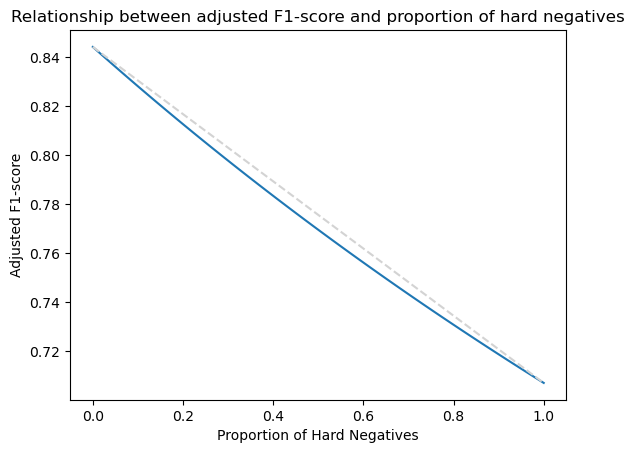

In [118]:
import math
prop = np.linspace(0, 1, 50)

tnr_weighted = (1-prop)*tnr_easy + prop*tnr_hard

TP = tpr * agg_positives_total.sum()
FN = (1-tpr) * agg_positives_total.sum()
# FP_weighted = (1-tnr_weighted) * (agg_hard_negatives_total.sum() + agg_easy_negatives_total.sum())

num_negs = (agg_hard_negatives_total.sum() + agg_easy_negatives_total.sum())/2 # For interpretability, we take arithmetic mean.
# num_negs = math.sqrt(agg_hard_negatives_total.sum() * agg_easy_negatives_total.sum())
# num_negs = 2/(1/agg_hard_negatives_total.sum() + 1/agg_easy_negatives_total.sum())
print(num_negs)
FP_weighted = (1-tnr_weighted) * (num_negs)
FP_easy = (1-tnr_easy) * agg_easy_negatives_total.sum()
FP_hard = (1-tnr_hard) * agg_hard_negatives_total.sum()
f1_weighted = TP/(TP+0.5*(FN+FP_weighted))
f1_easy = TP/(TP+0.5*(FN+FP_easy))
f1_hard = TP/(TP+0.5*(FN+FP_hard))


import matplotlib.pyplot as plt
plt.plot(prop,f1_weighted)
plt.plot(prop[[0,-1]], f1_weighted[[0,-1]], '--', c='lightgray')
plt.xlabel('Proportion of Hard Negatives')
plt.ylabel('Adjusted F1-score')
plt.title('Relationship between adjusted F1-score and proportion of hard negatives')


Task 2 - Mixed Task

In [16]:
# we do 5 samples
reps = 3
task_2_alt_positives_correct = np.zeros((100, num_senses,reps))
task_2_alt_positives_total = np.zeros((100, num_senses,reps))

In [17]:
import random
for i in range(2):
    random.seed(0)
    print(random.choice(list(easy_negatives[0].values())))
# print(random.choice(list(easy_negatives[0].values())))
random.seed(1)
for i in range(2):
    print(random.choice(list(easy_negatives[0].values())))

Noor senses the subtle shift in her stance as she instinctively leans forward, her body aligning with the sound of the falling mug. The weight of her apron pulls slightly at her shoulders, grounding her in the moment while she balances the demands of her busy environment.
Noor senses the subtle shift in her stance as she instinctively leans forward, her body aligning with the sound of the falling mug. The weight of her apron pulls slightly at her shoulders, grounding her in the moment while she balances the demands of her busy environment.
As the mug shatters, a waft of freshly ground coffee beans mingles with the scent of warm pastries from the bakery case. The rich aroma envelops Noor, intertwining with the faint, nutty sweetness of the oat milk, creating an inviting yet chaotic olfactory landscape.
A sharp, echoing clatter reverberates through the coffee shop, the sound of ceramic meeting tile ringing out like a sudden alarm. The gasp of a nearby customer follows, punctuated by the 

In [18]:
import random
# positives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()

for rep in range(reps):
    for i in range(100): # set to 100 later
        print(f'{i}-th story')
        
        for col in positives[i].keys():
            if str(positives[i][col]) == 'nan':
                continue
            
            count += 1
            
            for k in range(2): # pos/neg
                random.seed(count)
                print("Generating:", count, "-th prompt")
                # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
                prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
                prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
                prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percepts: \n 1. {positives[i][col]} \n 2. {random.choice(list(easy_negatives[i].values()))} \n\n"
                # prompt += f"Instructions: Select the most appropriate answer to the following question: "
                # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
                # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
                # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
                # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
                # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
                # prompt += f"Answers: A. No \nB. Yes"
                # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
                # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
                # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
                
                
                prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
                prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "
                prompt += f"Did the event cause the main character {protag_name[i]} to change their belief?"
                if k == 0:
                    prompt += f"A. No\nB. Yes"
                elif k == 1:
                    prompt += f"A. Yes\nB. No"              

                input_tokens += count_tokens(prompt)
                # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
                print(prompt)
                for _ in range(1): # generate 5 outputs. 
                    print("iteration ")
                    output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                    print('output: ', output)
                    model_answer = output[0][0]
                    if k == 0:
                        actual_answer = 'B' # positives
                        # actual_answer = 'A' # negatives
                    elif k == 1:
                        actual_answer = 'A' # positives
                        # actual_answer = 'B' # negatives
                        
                    
                    task_2_alt_positives_total[i, sense_dict[col], rep] += 1
                    task_2_alt_positives_correct[i, sense_dict[col], rep] += int(model_answer == actual_answer)
                    
                    output_tokens += count_tokens(output[0])
                    np.save('task_2_alt_positives_correct.npy', task_2_alt_positives_correct)
                    np.save('task_2_alt_positives_total.npy', task_2_alt_positives_total)
                    # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                    
        if i % 5 == 0:
            end = time.time()
            print(f'Time taken for these 5 stories: {end-begin} seconds.')
            begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', task_2_alt_positives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', task_2_alt_positives_correct.sum()/task_2_alt_positives_total.sum()) # this is the mean.



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percepts: 
 1. As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns. 
 2. As the mug shatters, a waft of freshly ground coffee beans mingles with the scent of warm pastries from the bakery case. The rich aroma envelops Noor, intertwining with the faint, nutty sweetness of the oat milk, creating an inv

In [20]:
task_2_positives_correct = np.zeros((100, num_senses,reps))
task_2_positives_total = np.zeros((100, num_senses,reps))

In [ ]:
# positives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()

for rep in range(reps):
    for i in range(100): # set to 100 later
        print(f'{i}-th story')
        for col in positives[i].keys():
            if str(positives[i][col]) == 'nan':
                continue
            count += 1
            for k in range(2): # pos/neg
                random.seed(count)
                print("Generating:", count, "-th prompt")
                # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
                prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
                prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
                prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percepts: \n 1. {positives[i][col]} \n 2. {random.choice(list(easy_negatives[i].values()))} \n\n"
                # prompt += f"Instructions: Select the most appropriate answer to the following question: "
                # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
                # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
                # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
                # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
                # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
                # prompt += f"Answers: A. No \nB. Yes"
                # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
                # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
                # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
                
                
                prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
                prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "

                prompt += f"After the event happened, based on the main character's perception of the event, is the following statement about {protag_name[i]}'s belief True or False: \n"
                prompt += f"Statement: \"{new_bigtom.iloc[i]['Story - Belief']}\""
                if k == 0:
                    prompt += f"A. True\nB. False"
                elif k == 1:
                    prompt += f"A. False\nB. True"              

                input_tokens += count_tokens(prompt)
                # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
                print(prompt)
                for _ in range(1): # generate 3 outputs. 
                    print("iteration ")
                    output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                    print('output: ', output)
                    model_answer = output[0][0]
                    if k == 0:
                        actual_answer = 'B' # positives
                        # actual_answer = 'A' # negatives
                    elif k == 1:
                        actual_answer = 'A' # positives
                        # actual_answer = 'B' # negatives
                        
                    
                    task_2_positives_total[i, sense_dict[col], rep] += 1
                    task_2_positives_correct[i, sense_dict[col], rep] += int(model_answer == actual_answer)
                    
                    output_tokens += count_tokens(output[0])
                    np.save('task_2_positives_correct.npy', task_2_positives_correct)
                    np.save('task_2_positives_total.npy', task_2_positives_total)
                    # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                    
        if i % 5 == 0:
            end = time.time()
            print(f'Time taken for these 5 stories: {end-begin} seconds.')
            begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', task_2_positives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', task_2_positives_correct.sum()/task_2_positives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percepts: 
 1. As Noor pours the milk into the espresso, she notices the liquid's texture. Instead of the familiar creamy, smooth flow that oat milk typically has, the milk appears slightly more translucent, with a thinner consistency that swirls differently in the cup, creating delicate, lacy patterns. 
 2. As the mug shatters, a waft of freshly ground coffee beans mingles with the scent of warm pastries from the bakery case. The rich aroma envelops Noor, intertwining with the faint, nutty sweetness of the oat milk, creating an inv

In [20]:
reps = 3
task_2_hard_negatives_correct = np.zeros((100, num_senses,reps))
task_2_hard_negatives_total = np.zeros((100, num_senses,reps))

In [21]:
import random
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()

for rep in range(reps):
    for i in range(100): # set to 100 later
        print(f'{i}-th story')
        for col in hard_negatives[i].keys():
            if str(hard_negatives[i][col]) == 'nan':
                continue
            count += 1
            for k in range(2): # pos/neg
                random.seed(count)
                print("Generating:", count, "-th prompt")
                # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
                prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
                prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
                # prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {hard_negatives[i][col]}\n\n"
                prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percepts, and nothing else: \n 1. {hard_negatives[i][col]} \n 2. {random.choice(list(easy_negatives[i].values()))} \n\n"
                # prompt += f"Instructions: Select the most appropriate answer to the following question: "
                # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
                # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
                # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
                # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
                # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
                # prompt += f"Answers: A. No \nB. Yes"
                # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
                # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
                # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
                
                
                prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
                prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "

                prompt += f"After the event happened, based on the main character's perception of the event, is the following statement about {protag_name[i]}'s belief True or False: \n"
                prompt += f"Statement: \"{new_bigtom.iloc[i]['Story - Belief']}\""
                if k == 0:
                    prompt += f"A. True\nB. False"
                else:
                    prompt += f"A. False\nB. True"              

                input_tokens += count_tokens(prompt)
                # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
                print(prompt)
                for _ in range(1): # generate 3 outputs. 
                    print("iteration ")
                    output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                    print('output: ', output)
                    model_answer = output[0][0]
                    if k == 0:
                        # actual_answer = 'B' # positives
                        actual_answer = 'A' # negatives
                    else:
                        # actual_answer = 'A' # positives
                        actual_answer = 'B' # negatives
                        
                    
                    task_2_hard_negatives_total[i, sense_dict[col],rep] += 1
                    task_2_hard_negatives_correct[i, sense_dict[col],rep] += int(model_answer == actual_answer)
                    
                    output_tokens += count_tokens(output[0])
                    np.save('task_2_hard_negatives_correct.npy', task_2_hard_negatives_correct)
                    np.save('task_2_hard_negatives_total.npy', task_2_hard_negatives_total)
                    # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                    
        if i % 5 == 0:
            end = time.time()
            print(f'Time taken for these 5 stories: {end-begin} seconds.')
            begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', task_2_hard_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', task_2_hard_negatives_correct.sum()/task_2_hard_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percepts, and nothing else: 
 1. A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font. 
 2. As the mug shatters, a waft of freshly ground coffee beans mingles with the scent of warm pastries from the bakery case. The rich aroma envelops Noor, intertwining with the faint, nutty sweetness of the oat milk, creating an inviting yet chaotic olfactory landscape. 

Before the event, the main character's initia

In [18]:
task_2_alt_hard_negatives_correct = np.zeros((100, num_senses,reps))
task_2_alt_hard_negatives_total = np.zeros((100, num_senses,reps))

In [19]:
# alt_hard_negatives
count = 0
input_tokens = 0
output_tokens = 0
begin = time.time()

for rep in range(reps):
    for i in range(100): # set to 100 later
        print(f'{i}-th story')
        for col in hard_negatives[i].keys():
            if str(hard_negatives[i][col]) == 'nan':
                continue
            count += 1
            for k in range(2): # pos/neg
                print("Generating:", count, "-th prompt")
                # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
                prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
                prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']}\n\n"
                # prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percept, and nothing else: {hard_negatives[i][col]}\n\n"
                prompt += f"Regarding the event, the main character {protag_name[i]} only encounters the following percepts, and nothing else: \n 1. {hard_negatives[i][col]} \n 2. {random.choice(list(easy_negatives[i].values()))} \n\n"
                # prompt += f"Instructions: Select the most appropriate answer to the following question: "
                # prompt += f"before the event, {protag_name[i]}'s initial belief was {new_bigtom.iloc[i]['Story - Belief']}. "
                # prompt += f"Does {protag_name[i]} maintain this initial belief after the event? Answer 'Yes' or 'No':\n\n"
                # prompt += f"A. {protag_name[i]} maintains their initial belief \nB. {protag_name[i]} changes their belief \n"
                # prompt += f"before the event, {protag_name[i]}\'s belief was \"{new_bigtom.iloc[i]['Story - Belief']}\". "
                # prompt += f"Did the event cause {protag_name[i]} to change this belief? \n"
                # prompt += f"Answers: A. No \nB. Yes"
                # prompt += f"Based on the story and the event, choose the answer option that best describes {protag_name[i]}\'s belief AFTER the event: \n"
                # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"
                # prompt += f"B. {new_bigtom.iloc[i]['Story - Belief']}"
                
                
                prompt += f"Before the event, the main character's initial belief was {new_bigtom.iloc[i]['Story - Belief']} "
                prompt += f"Instructions: Analyze the situation and select the most appropriate answer to the following question: "
                prompt += f"Did the event cause the main character {protag_name[i]} to change their belief?"
                if k == 0:
                    prompt += f"A. No\nB. Yes"
                elif k == 1:
                    prompt += f"A. Yes\nB. No"              

                input_tokens += count_tokens(prompt)
                # print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
                print(prompt)
                for _ in range(1): # generate 3 outputs. 
                    print("iteration ")
                    output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4")
                    print('output: ', output)
                    model_answer = output[0][0]
                    if k == 0:
                        # actual_answer = 'B' # positives
                        actual_answer = 'A' # negatives
                    elif k == 1:
                        # actual_answer = 'A' # positives
                        actual_answer = 'B' # negatives
                        
                    
                    task_2_alt_hard_negatives_total[i, sense_dict[col], rep] += 1
                    task_2_alt_hard_negatives_correct[i, sense_dict[col], rep] += int(model_answer == actual_answer)
                    
                    output_tokens += count_tokens(output[0])
                    np.save('task_2_alt_hard_negatives_correct.npy', task_2_alt_hard_negatives_correct)
                    np.save('task_2_alt_hard_negatives_total.npy', task_2_alt_hard_negatives_total)
                    # print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                    
        if i % 5 == 0:
            end = time.time()
            print(f'Time taken for these 5 stories: {end-begin} seconds.')
            begin = time.time()


print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)

print('Number of Questions: ', task_2_alt_hard_negatives_total.sum())
print('Number of Questions (Sanity Check): ', 2*count)
print('accuracy: ', task_2_alt_hard_negatives_correct.sum()/task_2_alt_hard_negatives_total.sum())



0-th story
Generating: 1 -th prompt
Story: Noor is working as a barista at a busy coffee shop.  Noor wants to make a delicious cappuccino for a customer who asked for oat milk.  Noor grabs a milk pitcher and fills it with oat milk. 

Event:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task.

Regarding the event, the main character Noor only encounters the following percepts, and nothing else: 
 1. A bright green label on the milk carton nearby suddenly catches Noor’s eye, glistening under the café's overhead lights. The bold print reads “Almond Milk” in a slightly whimsical font. 
 2. The taste of the air shifts as a hint of spilled coffee drips from the counter, its bitter notes contrasting with the creamy sweetness of the oat milk. The residual flavors of caramel and chocolate linger on Noor’s tongue, a reminder of the last cappuccino she crafted moments before the mug fell. 

Before the eve

In [145]:
task_2_hard_negatives_total = np.load('task_2_hard_negatives_total_final.npy')
task_2_alt_hard_negatives_total = np.load('task_2_alt_hard_negatives_total_final.npy')
task_2_hard_negatives_correct = np.load('task_2_hard_negatives_correct_final.npy')
task_2_alt_hard_negatives_correct = np.load('task_2_alt_hard_negatives_correct_final.npy')

task_2_positives_total = np.load('task_2_positives_total_final.npy')
task_2_alt_positives_total = np.load('task_2_alt_positives_total_final.npy')
task_2_positives_correct = np.load('task_2_positives_correct_final.npy')
task_2_alt_positives_correct = np.load('task_2_alt_positives_correct_final.npy')

task_2_agg_positives_total = task_2_positives_total + task_2_alt_positives_total
task_2_agg_positives_correct = task_2_positives_correct + task_2_alt_positives_correct
task_2_agg_hard_negatives_total = task_2_hard_negatives_total + task_2_alt_hard_negatives_total
task_2_agg_hard_negatives_correct = task_2_hard_negatives_correct + task_2_alt_hard_negatives_correct

print(task_2_agg_positives_total.sum())
print(task_2_agg_positives_correct.sum())
print(task_2_agg_hard_negatives_total.sum())
print(task_2_agg_hard_negatives_correct.sum())

4756.0
4159.0
1980.0
818.0


In [152]:
print(task_2_agg_positives_total.shape)

(100, 8, 3)


In [151]:
print(task_2_agg_positives_total.shape)
task_2_tpr = task_2_agg_positives_correct.sum()/task_2_agg_positives_total.sum() # true positive rate
task_2_tnr = task_2_agg_hard_negatives_correct.sum()/task_2_agg_hard_negatives_total.sum()
print('Task 2 True positive rate: ', task_2_tpr)
print('Task 2 True negative rate (hard negatives only): ', task_2_tnr)
print('Task 1 True positive rate: ', tpr)
print('Task 1 True negative rate (hard negatives only): ', tnr_hard)

(100, 8, 3)
Task 2 True positive rate:  0.8744743481917577
Task 2 True negative rate (hard negatives only):  0.4131313131313131
Task 1 True positive rate:  0.9343434343434344
Task 1 True negative rate (hard negatives only):  0.41818181818181815


In [30]:


task_2_TP = task_2_tpr * task_2_agg_positives_total.sum()
task_2_FN = (1-task_2_tpr) * task_2_agg_positives_total.sum()


task_2_FP = (1-tnr_hard) * task_2_agg_hard_negatives_total.sum()
task_2_f1_score = task_2_TP/(task_2_TP+0.5*(task_2_FN+task_2_FP))

print(task_2_f1_score)


0.8262640309923512


In [24]:
# from sklearn.metrics import confusion_matrix
# print(np.mean(ans == np.array(percepts[1])))
# confusion_matrix(ans, np.array(percepts[1]))


In [23]:
# from sklearn.metrics import confusion_matrix
# print(np.mean(ans_1[:,0] == np.array(percepts[1])))
# print(confusion_matrix(ans_1[:,0], np.array(percepts[1])))

# print(np.mean(ans_1[:,1] == np.array(percepts[1])))
# print(confusion_matrix(ans_1[:,1], np.array(percepts[1])))



In [22]:
# # Alternative 2-round prompting
# two_round_ans = np.repeat('K', (8*8))
# # two_round_ans = two_round_ans.reshape(-1,2)
# input_tokens = 0
# output_tokens = 0
# for i in range(8):
#     for j in range(8):
#         for k in range(1):
#             print("Generating:", i*8+j, "-th prompt")
#             # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
#             prior = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
#             prior += f"Instructions: Based on the story, what is {protag_name[i]}'s initial belief? \n\n"
#             prior += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"    
#             prior += f"B. {new_bigtom.iloc[i]['Answers - Belief Aware']} \n"  
#             prior_ans = f"A.\n"  
#             msg_history = [{'role':'user', 'content':prior}, {'role':'assistant', 'content':prior_ans}]
            
#             prompt = f"Continued Story: {new_bigtom.iloc[i]['Story - An external event']} {percepts.iloc[i*8+j][0] }\n\n"
#             prompt += f"Instructions: Based on {protag_name[i]}'s perception of the event, does {protag_name[i]} maintain their initial belief of \"{new_bigtom.iloc[i]['Story - Belief']}\"?\n"
#             prompt += f"A. Yes \n"    
#             prompt += f"B. No"                 

            
#             print("input tokens = ", count_tokens(prompt) + count_tokens(str(msg_history)), ". price (USD) is ", count_tokens(prompt)*30/1000000 + count_tokens(str(msg_history)) * 30/1000000)
#             print(prompt)
#             for _ in range(1): # generate 3 outputs. 
#                 print("iteration ")
#                 output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4", msg_history = msg_history)
#                 print(output)
#                 print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
#                 two_round_ans[i*8+j] = output[0].split()[0][0]
                
#     if i % 5 == 0:
#         save_list_of_dict(f'saved_random_percepts_backup_v{i}.pkl', random_percepts) # for backup purpose
#         end = time.time()
#         print(f'Time taken for these 5 stories: {end-begin} seconds.')
#         begin = time.time()


# print("input tokens = ", input_tokens, ". price (USD) is ", input_tokens*30/1000000)
# print("output tokens = ", output_tokens, ". price (USD) is ", output_tokens*60/1000000)
            
# print(two_round_ans)




In [233]:
# # Alternative 2-round prompting
# two_round_ans_spell_out = np.repeat('K', (8*8))
# # two_round_ans = two_round_ans.reshape(-1,2)

# for i in range(8):
#     for j in range(8):
#         for k in range(1):
#             print("Generating:", i*8+j, "-th prompt")
#             # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
#             prior = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
#             prior += f"Instructions: Based on the story, what is {protag_name[i]}'s initial belief? \n\n"
#             prior += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"    
#             prior += f"B. {new_bigtom.iloc[i]['Answers - Belief Aware']} \n"  
#             prior_ans = f"A.\n"  
#             msg_history = [{'role':'user', 'content':prior}, {'role':'assistant', 'content':prior_ans}]
            
#             prompt = f"Continued Story: {new_bigtom.iloc[i]['Story - An external event']} {percepts.iloc[i*8+j][0] }\n\n"
#             prompt += f"Instructions: Based on {protag_name[i]}'s perception of the event, which of the following options best describes {protag_name[i]}'s belief after the event? Respond solely with A or B. \n"
#             prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"    
#             prompt += f"B. {new_bigtom.iloc[i]['Answers - Belief Aware']}"                

            
#             print("input tokens = ", count_tokens(prompt) + count_tokens(str(msg_history)), ". price (USD) is ", count_tokens(prompt)*30/1000000 + count_tokens(str(msg_history)) * 30/1000000)
#             print(prompt)
#             for _ in range(1): # generate 3 outputs. 
#                 print("iteration ")
#                 output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4", msg_history = msg_history)
#                 print(output)
#                 print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
#                 two_round_ans_spell_out[i*8+j] = output[0].split()[0][0]
            
# print(two_round_ans_spell_out)


Generating: 0 -th prompt
input tokens =  248 . price (USD) is  0.00744
Continued Story:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task. When Noor picks up the milk pitcher, the pitcher feels slightly lighter than she remembers.

Instructions: Based on Noor's perception of the event, which of the following options best describes Noor's belief after the event? Respond solely with A or B. 
A.  Noor believes that the milk pitcher contains oatmilk. 
B. Noor believes the milk pitcher contains almond milk.
iteration 
('A.', 232, 2)
output tokens =  2 . price (USD) is  0.00012
Generating: 1 -th prompt
input tokens =  257 . price (USD) is  0.00771
Continued Story:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task. As she steams the milk, Noor instantly hears an unfamiliar, higher-pitched hiss that seems sha

In [251]:
np.savetxt("prompt1.csv", two_round_ans == 'A', delimiter=",")

In [246]:
# Alternative 2-round prompting
gts = np.repeat('K', (8)*2)
gts = gts.reshape(-1,2)

for i in range(8):
    for j in range(2):
        for k in range(1):
            print("Generating:", i*8+j, "-th prompt")
            # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} {new_bigtom.iloc[i]['Story - Belief']}\n\n"
            prior = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
            prior += f"Instructions: Based on the story, what is {protag_name[i]}'s initial belief? \n\n"
            prior += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"    
            prior += f"B. {new_bigtom.iloc[i]['Answers - Belief Aware']} \n"  
            prior_ans = f"A.\n"  
            msg_history = [{'role':'user', 'content':prior}, {'role':'assistant', 'content':prior_ans}]
        
            prompt = f"Continued Story: {new_bigtom.iloc[i]['Story - An external event']} \n\n"
            if j == 0:
                prompt += f"{new_bigtom.iloc[i]['Percepts - Aware of event']}"
            else:
                prompt += f"{new_bigtom.iloc[i]['Percepts - Not aware of event']}"
            # prompt += f"Instructions: After the event, which of the following options best describes {protag_name[i]}'s belief after the event? Respond solely with A or B. \n"
            # prompt += f"A. {new_bigtom.iloc[i]['Story - Belief']} \n"    
            # prompt += f"B. {new_bigtom.iloc[i]['Answers - Belief Aware']}"    
            prompt += f"Instructions: After the event, does {protag_name[i]} maintain their initial belief of \"{new_bigtom.iloc[i]['Story - Belief']}\"?\n"
            prompt += f"A. Yes \n"    
            prompt += f"B. No"                          

            
            print("input tokens = ", count_tokens(prompt) + count_tokens(str(msg_history)), ". price (USD) is ", count_tokens(prompt)*30/1000000 + count_tokens(str(msg_history)) * 30/1000000)
            print(prompt)
            for _ in range(1): # generate 3 outputs. 
                print("iteration ")
                output = LM_generation(prompt, temperature = 0, max_tokens = 3, model = "gpt-4", msg_history = msg_history)
                print(output)
                print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)
                gts[i,j] = output[0].split()[0][0]
            
print(gts)


Generating: 0 -th prompt
input tokens =  213 . price (USD) is  0.00639
Continued Story:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task. 

Noor sees her coworker swapping the milk.Instructions: After the event, does Noor maintain their initial belief of " Noor believes that the milk pitcher contains oatmilk."?
A. Yes 
B. No
iteration 
('B. No', 197, 3)
output tokens =  3 . price (USD) is  0.00018
Generating: 1 -th prompt
input tokens =  215 . price (USD) is  0.00645
Continued Story:  A coworker, who didn't hear the customer's request, swaps the oat milk in the pitcher with almond milk while Noor is attending to another task. 

Noor does not see her coworker swapping the milk.Instructions: After the event, does Noor maintain their initial belief of " Noor believes that the milk pitcher contains oatmilk."?
A. Yes 
B. No
iteration 
('A. Yes', 199, 3)
output tokens =  3 . price (USD) is  0.00018

In [250]:
from sklearn.metrics import confusion_matrix
print(np.mean(two_round_ans == np.array(percepts[1])))
confusion_matrix(two_round_ans, np.array(percepts[1]))

0.53125


array([[ 6,  6],
       [24, 28]])

In [234]:
from sklearn.metrics import confusion_matrix
print(np.mean(two_round_ans_spell_out == np.array(percepts[1])))
confusion_matrix(two_round_ans_spell_out, np.array(percepts[1]))

0.546875


array([[ 9,  8],
       [21, 26]])

In [15]:
import json

# Open the JSON file
with open('fantom_v1.json') as f:
    fantom_data = json.load(f)

# Print the data (it will be stored as a Python dictionary)


dict_keys(['set_id', 'part_id', 'conv_id', 'full_context', 'short_context', 'missed_info', 'joining_speaker', 'factQA', 'beliefQAs', 'infoAccessibilityQA_list', 'answerabilityQA_list', 'infoAccessibilityQAs_binary', 'answerabilityQAs_binary'])
Dillon


**View FANToM**

In [53]:
p = 20
print(fantom_data[p].keys())
print(fantom_data[p]['joining_speaker'])

dict_keys(['set_id', 'part_id', 'conv_id', 'full_context', 'short_context', 'missed_info', 'joining_speaker', 'factQA', 'beliefQAs', 'infoAccessibilityQA_list', 'answerabilityQA_list', 'infoAccessibilityQAs_binary', 'answerabilityQAs_binary'])
Zachery


In [54]:
print('1', fantom_data[p]['full_context'])
print('2', fantom_data[p]['short_context'])
print('3', fantom_data[p]['missed_info'])
print('4', fantom_data[p]['beliefQAs'])

1 Alana: Hi Drake, travel experiences, eh? Can't wait to share. So what's your all-time favorite travel destination?
Drake: Well, hi Alana, my favorite place so far has to be Greece. The culture, the history, the cuisine, are all incredible. How about you?
Alana: Oh, Greece? That sounds wonderful! I have heard the Greek Islands are enchanting. My favorite travel destination so far was Bali, Indonesia. I fell in love with its serene beaches and the hospitality of the folks there is just out of the world.
Drake: Fascinating! Yeah, I have heard a lot about the charm of Bali too. I imagine the tranquility amidst lush landscapes, and the vibrant culture. What was your favorite aspect of the trip?
Alana: Hmm, I believe it's a tie between the beaches and the beautiful temples there. And the locals, known as 'Balinese', are—one of the friendliest people I have ever met. Did you have a similar experience in Greece?
Drake: Absolutely! I also had an exceptional time exploring the historical sites

 In the provided dialogue, “Zachery does not know about the favorite travel destinations that Alana and Drake discussed because he was not involved in the conversation when this was discussed”.

From this dialogue, generate 10 perceptual cues that {protagonist name} may notice, which may leads to the outcome: {alternative belief}. Be creative and make the stories diverse (from different contexts). Please answer in only one sentence.

In [55]:
# p = 20
prompt =  f"Dialogue: {fantom_data[p]['short_context']}"
prompt += f"Summarized Story from Dialogue: {fantom_data[p]['missed_info']} \n\n"
prompt += f"Instructions: In the story, {fantom_data[p]['joining_speaker']}'s belief is: \"{fantom_data[p]['beliefQAs'][0]['correct_answer']}\". "
prompt += f"Generate an external event that changes {fantom_data[p]['joining_speaker']}'s belief to: "
prompt += f"\"{fantom_data[p]['beliefQAs'][0]['wrong_answer']}\" The event must happen after the dialogue. "
prompt += "Be creative and make the stories diverse (from different contexts). Please answer in only one sentence."
# prompt += f"Instructions: In the provided dialogue, \"{fantom_data[p]['beliefQAs'][0]['correct_answer']}\". \n\n"
# prompt += f"From this dialogue, generate 10 perceptual cues that {fantom_data[p]['joining_speaker']} may notice, "
# prompt += f"which may lead to {fantom_data[p]['joining_speaker']} believing: \"{fantom_data[p]['beliefQAs'][0]['wrong_answer']}\". "
# prompt += "Write one sentence for each perceptual cue. Be creative and make the stories diverse (from different contexts)."
print(prompt)



Dialogue: Alana: Hi Drake, travel experiences, eh? Can't wait to share. So what's your all-time favorite travel destination?
Drake: Well, hi Alana, my favorite place so far has to be Greece. The culture, the history, the cuisine, are all incredible. How about you?
Alana: Oh, Greece? That sounds wonderful! I have heard the Greek Islands are enchanting. My favorite travel destination so far was Bali, Indonesia. I fell in love with its serene beaches and the hospitality of the folks there is just out of the world.
Drake: Fascinating! Yeah, I have heard a lot about the charm of Bali too. I imagine the tranquility amidst lush landscapes, and the vibrant culture. What was your favorite aspect of the trip?
Alana: Hmm, I believe it's a tie between the beaches and the beautiful temples there. And the locals, known as 'Balinese', are—one of the friendliest people I have ever met. Did you have a similar experience in Greece?
Drake: Absolutely! I also had an exceptional time exploring the historic

In [52]:
print("input tokens = ", count_tokens(prompt), ". price (USD) is ", count_tokens(prompt)*30/1000000)
print(prompt)
for _ in range(1): # generate 3 outputs. 
    print("iteration ")
    output = LM_generation(prompt, temperature = 1.2, max_tokens = 1000, model = "gpt-4o-mini")
    print(output)
    print("output tokens = ", count_tokens(output[0]), ". price (USD) is ", count_tokens(output[0])*60/1000000)

input tokens =  507 . price (USD) is  0.01521
Dialogue: Gianna: Guys, I've really enjoyed sharing our pet stories, but I need to excuse myself. I need to change clothes for a meeting later. Talk to you later!
Sara: Sure thing, Gianna. Take care!
Javier: Catch you later, Gianna.
Sara: So Javier, have you ever tried training Bruno?
Javier: Yes, I did actually. It was a challenge at times, but rewarding nevertheless. How about you? Did you try training Snowflake?
Sara: Oh gosh, trying to train a cat is a whole different ball game. But I did manage to teach her a few commands and tricks. She was quite an intelligent little furball.
Gianna: Hey guys, I'm back, couldn't miss out on more pet stories. Speaking of teaching and training pets, it is amazing how that further strengthens the bond between us and our pets, right?
Sara: Absolutely, Gianna! The fact that they trust us enough to learn from us is really special.
Javier: I can't agree more. I believe that's one of the ways Bruno conveyed 

Question: In the provided dialogue, {protagonist name} is the protagonist. The protagonist’s belief is “Zachery does not know about the favorite travel destinations that Alana and Drake discussed because he was not involved in the conversation when this was discussed”.

Generate an external event that changes the protagonist’s belief to the other extreme state “Zachery believes that the favorite travel destinations Alana and Drake discussed were Bali, Indonesia and Greece.” The event must happen after the dialogue. It must be physically plausible and only change the object's state once. It must be possible for the agent to be unaware of this event happening. Be creative and make the stories diverse (from different contexts). Please answer in only one sentence.

In [164]:
#Store Prompts
story_list = []
for i in range(200): # skip 0 cuz we already did it. 
    print("Generating:", i, "-th prompt")
    prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']}\n\n"
    prompt += f"Main character's belief: {new_bigtom.iloc[i]['Story - Belief']}\n\n"
    # prompt = f"Story: {new_bigtom.iloc[i]['Story - Context']} {new_bigtom.iloc[i]['Story - Desire']} {new_bigtom.iloc[i]['Story - Perception cues']} \n\n"
    prompt += f"Event: {new_bigtom.iloc[i]['Story - An external event']} \n\n"
    story_list.append(prompt)

Generating: 0 -th prompt
Generating: 1 -th prompt
Generating: 2 -th prompt
Generating: 3 -th prompt
Generating: 4 -th prompt
Generating: 5 -th prompt
Generating: 6 -th prompt
Generating: 7 -th prompt
Generating: 8 -th prompt
Generating: 9 -th prompt
Generating: 10 -th prompt
Generating: 11 -th prompt
Generating: 12 -th prompt
Generating: 13 -th prompt
Generating: 14 -th prompt
Generating: 15 -th prompt
Generating: 16 -th prompt
Generating: 17 -th prompt
Generating: 18 -th prompt
Generating: 19 -th prompt
Generating: 20 -th prompt
Generating: 21 -th prompt
Generating: 22 -th prompt
Generating: 23 -th prompt
Generating: 24 -th prompt
Generating: 25 -th prompt
Generating: 26 -th prompt
Generating: 27 -th prompt
Generating: 28 -th prompt
Generating: 29 -th prompt
Generating: 30 -th prompt
Generating: 31 -th prompt
Generating: 32 -th prompt
Generating: 33 -th prompt
Generating: 34 -th prompt
Generating: 35 -th prompt
Generating: 36 -th prompt
Generating: 37 -th prompt
Generating: 38 -th pro